In [1]:
%load_ext autoreload
%autoreload 2

In [154]:
import pandas as pd
import numpy as np
import pickle
import sys
import time
import glob
import re
from tqdm import tqdm
import tweepy
from sklearn.model_selection import cross_validate
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, precision_recall_curve
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
import classifier_utils as cu
from sklearn.metrics import f1_score

import shap
from plotly.offline import init_notebook_mode
import plotly.offline as py
import plotly.graph_objs as go
init_notebook_mode(connected=True)

import matplotlib.pyplot as plt

In [90]:
def get_toxic_comments_dataset():
    # From PerspectiveAI Kaggle competition
    df = pd.read_csv("../data/datasets/toxic_comment/train.csv")
    classes = ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']
    Y = df[classes].astype(int).values
    X = df['comment_text']
    return X, Y, classes, df

def get_hate_abuse_dataset():
    # From: Large Scale Crowdsourcing and Characterization of Twitter Abusive Behavior
    df = pd.read_csv("../data/datasets/hate_abuse_speech/hatespeech_text_label_vote.csv", sep='\t', header=None, names=['text', 'label', 'votes'])
    X = df['text']
    Y = df['label']
    classes = np.unique(Y)
    return X, Y.values, classes, df


def get_hate_offensive_speech_dataset():
    # Automated Hate Speech Detection and the Problem of Offensive Language∗
    df = pd.read_csv("../data/datasets/hatespeech_offensive/labeled_data.csv")
    X = df['tweet']
    Y = df['class']
    classes = ['hate', 'offensive', 'neither']
    return X, Y, classes, df


def get_harassment_umd_dataset():
    df = pd.read_csv("../data/datasets/online_harassment_dataset/onlineHarassmentDataset.tdf", sep='\t', encoding='latin-1', memory_map=True)
    df['Label'] = df['Code'].apply(lambda x: 1 if x == 'H' else 0)
    df = df[['ID', 'Label', 'Tweet']]
    X = df['Tweet']
    Y = df['Label'].astype(int)
    classes = ['Harassment', 'Normal']
    return X, Y, classes, df

In [105]:
def evaluate_model(model, x, y, name):
    print(name)
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0)
    model.fit(X_train, y_train)
    preds_proba = model.predict_proba(X_test)[:, 1]
    preds = (preds_proba > 0.5).astype(int)
    
    print(classification_report(y_test, preds))
    fpr, tpr, _ = roc_curve(y_test, preds_proba)
    roc_auc = auc(fpr, tpr)
    print('AUC: ', roc_auc)
    
    
    fig_pr = go.Figure()
    fig_roc = go.Figure()

    fpr, tpr, thresh = roc_curve(y_test, preds_proba)

    fig_roc.add_trace(go.Scatter(
        x=fpr, 
        y=tpr,
        text=thresh
    ))

    fig_roc.show()


    precision, recall, thresh = precision_recall_curve(y_test, preds_proba)


    fig_pr.add_trace(go.Scatter(
        x=precision, 
        y=recall,
        text = thresh
    ))

    fig_pr.show()
    return y_test, preds_proba
    
    
def evaluate_multiclass_model(model, x, y, classes, name):
    print(name)
    Y = label_binarize(Y, classes=classes)
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0)
    model.fit(X_train, y_train)
    preds_proba = model.predict_proba(X_test)
    preds = classes[preds_proba.argmax(axis=1)]
    print(classification_report(y_test, preds))

    return y_test, preds_proba
    

In [109]:
X, Y, classes, df = get_toxic_comments_dataset()
model = cu.get_pipeline('gboost')
for i in range(len(classes)):
    y = Y[:, i]
    y_test, preds_proba = evaluate_model(model, X, y, classes[i])
    pickle.dump((y_test, preds_proba), open('final_model_gboost_perf_toxic_comments_' + classes[i] + '.p', 'wb'))
    
    model.fit(X, y)
    pickle.dump(model, open('final_model_gboost_toxic_comments_' + classes[i] + '.p', 'wb'))

toxic


/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'", 'becau'] not in stop_words.



              precision    recall  f1-score   support

           0       0.95      0.99      0.97     28814
           1       0.90      0.56      0.69      3101

    accuracy                           0.95     31915
   macro avg       0.93      0.78      0.83     31915
weighted avg       0.95      0.95      0.95     31915

AUC:  0.9513497729334385


severe_toxic
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     31586
           1       0.51      0.25      0.34       329

    accuracy                           0.99     31915
   macro avg       0.75      0.62      0.67     31915
weighted avg       0.99      0.99      0.99     31915

AUC:  0.9757011638221467


obscene
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     30217
           1       0.87      0.67      0.76      1698

    accuracy                           0.98     31915
   macro avg       0.93      0.83      0.87     31915
weighted avg       0.98      0.98      0.98     31915

AUC:  0.9739174525311279


threat
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31824
           1       0.36      0.18      0.24        91

    accuracy                           1.00     31915
   macro avg       0.68      0.59      0.62     31915
weighted avg       1.00      1.00      1.00     31915

AUC:  0.8311045572074983


insult
              precision    recall  f1-score   support

           0       0.98      0.99      0.98     30321
           1       0.78      0.56      0.65      1594

    accuracy                           0.97     31915
   macro avg       0.88      0.77      0.82     31915
weighted avg       0.97      0.97      0.97     31915

AUC:  0.9644860014573466


identity_hate
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     31617
           1       0.59      0.33      0.42       298

    accuracy                           0.99     31915
   macro avg       0.79      0.66      0.71     31915
weighted avg       0.99      0.99      0.99     31915

AUC:  0.9574181483795249


In [147]:
X, Y, _, df =  get_hate_abuse_dataset()
X = X[Y != 'spam']
Y = Y[Y != 'spam']

classes=['abusive', 'hateful', 'normal']
Y = label_binarize(Y, classes=classes)

model = cu.get_pipeline('gboost')
for i in range(len(classes)):
    y = Y[:, i]
    y_test, preds_proba = evaluate_model(model, X, y, classes[i])
    pickle.dump((y_test, preds_proba), open('final_model_gboost_perf_hate_abuse_' + classes[i] + '.p', 'wb'))
    
    model.fit(X, y)
    pickle.dump(model, open('final_model_gboost_hate_abuse_' + classes[i] + '.p', 'wb'))

abusive
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     11853
           1       0.89      0.90      0.89      5341

    accuracy                           0.93     17194
   macro avg       0.92      0.92      0.92     17194
weighted avg       0.93      0.93      0.93     17194

AUC:  0.9711700260412482


hateful
              precision    recall  f1-score   support

           0       0.96      0.99      0.97     16237
           1       0.70      0.23      0.34       957

    accuracy                           0.95     17194
   macro avg       0.83      0.61      0.66     17194
weighted avg       0.94      0.95      0.94     17194

AUC:  0.8356149432044631


normal
              precision    recall  f1-score   support

           0       0.95      0.89      0.92      6298
           1       0.94      0.97      0.95     10896

    accuracy                           0.94     17194
   macro avg       0.94      0.93      0.93     17194
weighted avg       0.94      0.94      0.94     17194

AUC:  0.9683438898510541


In [87]:
X, Y, classes, df = get_harassment_umd_dataset()
model = cu.get_pipeline('rf')
y_test, preds_proba = evaluate_model(model, X, Y, 'UMD_harassment')

UMD_harassment
              precision    recall  f1-score   support

           0       0.78      0.96      0.86      3059
           1       0.62      0.19      0.29      1013

    accuracy                           0.77      4072
   macro avg       0.70      0.57      0.57      4072
weighted avg       0.74      0.77      0.72      4072

AUC:  0.6451275620270902


In [152]:
X, Y, classes, df = get_hate_offensive_speech_dataset()
classes=[0, 1, 2]
class_names = ['Hate', 'Offensive', 'Neither']
Y = label_binarize(Y, classes=classes)

model = cu.get_pipeline('gboost')
for i in range(len(classes)):
    y = Y[:, i]
    y_test, preds_proba = evaluate_model(model, X, y, class_names[i])
    pickle.dump((y_test, preds_proba), open('final_model_gboost_perf_hate_offensive_' + class_names[i] + '.p', 'wb'))
    
    model.fit(X, y)
    pickle.dump(model, open('final_model_gboost_hate_offensive_' + class_names[i] + '.p', 'wb'))
    
# model = cu.get_pipeline('gboost')
# y_test, preds_proba = evaluate_multiclass_model(model, X, Y, classes, 'hate_offensive_speech')

Hate
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      4678
           1       0.60      0.13      0.21       279

    accuracy                           0.95      4957
   macro avg       0.78      0.56      0.59      4957
weighted avg       0.93      0.95      0.93      4957

AUC:  0.8644624192245864


Offensive
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      1105
           1       0.94      0.94      0.94      3852

    accuracy                           0.91      4957
   macro avg       0.87      0.87      0.87      4957
weighted avg       0.91      0.91      0.91      4957

AUC:  0.9425643609948172


Neither
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      4131
           1       0.82      0.86      0.84       826

    accuracy                           0.95      4957
   macro avg       0.90      0.91      0.90      4957
weighted avg       0.95      0.95      0.95      4957

AUC:  0.9782524853423269


array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

In [164]:
[f1_score(y_test, preds_proba > t) for t in np.linspace(0,1,101)] 

[0.28566487982016253,
 0.39912706110572255,
 0.4779069767441861,
 0.5186355022109918,
 0.630073444143796,
 0.7110916264796142,
 0.7276805742485419,
 0.7336047037539576,
 0.7403012323140119,
 0.7543123543123543,
 0.7589118198874297,
 0.7615457115928369,
 0.7672536887196574,
 0.7712230215827338,
 0.777187046882552,
 0.7781007751937985,
 0.7843137254901961,
 0.7946161515453639,
 0.7977977977977977,
 0.7999999999999999,
 0.8077118214104516,
 0.813299232736573,
 0.8168724279835391,
 0.8202479338842975,
 0.8245067497403946,
 0.829064296915839,
 0.8325459317585301,
 0.8369393139841689,
 0.8392572944297082,
 0.8404255319148937,
 0.8435664709022958,
 0.8439678284182305,
 0.8454054054054054,
 0.8464460119370592,
 0.8504366812227074,
 0.8478500551267916,
 0.8485523385300668,
 0.8486878838637634,
 0.8484848484848485,
 0.845150311968236,
 0.8439635535307517,
 0.8447488584474887,
 0.8435530085959885,
 0.8421658986175116,
 0.8421052631578947,
 0.844186046511628,
 0.842781998831093,
 0.8429073856975381,
 0.8409225310467179,
 0.8395500296033156,
 0.8391691394658753,
 0.8401663695781344,
 0.8372093023255814,
 0.8370149253731343,
 0.837125748502994,
 0.8353365384615384,
 0.8347406513872135,
 0.8350453172205439,
 0.8309002433090024,
 0.8327228327228327,
 0.8270303781773093,
 0.8248587570621468,
 0.8237523689197725,
 0.8015925680159258,
 0.7869742198100407,
 0.7780821917808219,
 0.7603654251581166,
 0.7505330490405119,
 0.74481772694782,
 0.7341040462427745,
 0.7223443223443223,
 0.6913207547169812,
 0.6753645433614736,
 0.6483946750195771,
 0.6316626889419253,
 0.5651438240270727,
 0.5462402765773552,
 0.5219683655536028,
 0.5137289636846767,
 0.5053571428571428,
 0.4823209428830463,
 0.4329896907216494,
 0.41103710751665085,
 0.3930635838150289,
 0.3468780971258672,
 0.2615062761506276,
 0.21505376344086022,
 0.15161649944258637,
 0.11174458380843787,
 0.0677570093457944,
 0.028639618138424826,
 0.019184652278177457,
 0.002418379685610641,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [79]:
X, Y, classes, df = get_hate_offensive_speech_dataset()
model = cu.get_pipeline('rf')
y_test, preds_proba = evaluate_multiclass_model(model, X, Y, classes, 'hate_offensive_speech')

hate_offensive_speech
              precision    recall  f1-score   support

        hate       0.50      0.02      0.04       279
   offensive       0.88      0.98      0.93      3852
     neither       0.88      0.66      0.76       826

    accuracy                           0.88      4957
   macro avg       0.75      0.55      0.57      4957
weighted avg       0.86      0.88      0.85      4957



In [68]:
df.loc[df['class']==0]['tweet'].values

array(['"@Blackman38Tide: @WhaleLookyHere @HowdyDowdy11 queer" gaywad',
       '"@CB_Baby24: @white_thunduh alsarabsss" hes a beaner smh you can tell hes a mexican',
       '"@DevilGrimz: @VigxRArts you\'re fucking gay, blacklisted hoe" Holding out for #TehGodClan anyway http://t.co/xUCcwoetmn',
       ..., 'you a pussy ass nigga and I know it nigga.',
       "you're all niggers",
       "you're such a retard i hope you get type 2 diabetes and die from a sugar rush you fucking faggot @Dare_ILK"],
      dtype=object)

In [69]:
df.loc[df['class']==1]['tweet'].values

array(['!!!!! RT @mleew17: boy dats cold...tyga dwn bad for cuffin dat hoe in the 1st place!!',
       '!!!!!!! RT @UrKindOfBrand Dawg!!!! RT @80sbaby4life: You ever fuck a bitch and she start to cry? You be confused as shit',
       '!!!!!!!!! RT @C_G_Anderson: @viva_based she look like a tranny',
       ...,
       "you's a muthaf***in lie &#8220;@LifeAsKing: @20_Pearls @corey_emanuel right! His TL is trash &#8230;. Now, mine? Bible scriptures and hymns&#8221;",
       'young buck wanna eat!!.. dat nigguh like I aint fuckin dis up again',
       'youu got wild bitches tellin you lies'], dtype=object)

In [57]:
X = X[Y < 2]
Y = 1 - Y[Y < 2]

In [58]:
y_test, preds_proba = evaluate_model(model, X, Y, 'hate_offensive_speech2')

hate_offensive_speech2
              precision    recall  f1-score   support

           0       0.94      1.00      0.97      3853
           1       0.74      0.05      0.10       271

    accuracy                           0.94      4124
   macro avg       0.84      0.53      0.53      4124
weighted avg       0.92      0.94      0.91      4124

AUC:  0.8535137713173135


In [59]:
go.Figure().add_trace(go.Histogram(x=preds_proba))

In [63]:
print(classification_report(y_test, preds_proba > 0.3))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      3853
           1       0.61      0.24      0.35       271

    accuracy                           0.94      4124
   macro avg       0.78      0.62      0.66      4124
weighted avg       0.93      0.94      0.93      4124



In [4]:
df1 = pd.read_csv("../data/datasets/hatespeech_offensive/labeled_data.csv")
df2 = pd.read_csv("../data/datasets/toxic_comment/train.csv")

In [23]:
X_pos = np.concatenate([
#         df1.loc[df1['class'] < 2]['tweet'].values,
        df2.loc[np.logical_or.reduce([ df2['severe_toxic']])]['comment_text'].values
])
Y_pos = np.ones(len(X_pos))

In [24]:
X_neg = np.concatenate([
#     df1.loc[df1['class'] == 2]['tweet'].values,
    df2.loc[np.logical_not(np.logical_or.reduce([ df2['severe_toxic']]))]['comment_text'].values
])
Y_neg = np.zeros(len(X_neg))

In [25]:
X_pos

array(['COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK',
       'Stupid peace of shit stop deleting my stuff asshole go die and fall in a hole go to hell!',
       "you are a stupid fuck \n\nand your mother's cunt stinks", ...,
       "LoL!! \n\nyou're GAY!! you will never know how good it feels to fuck a woman up the ass!!",
       "Walter Mercado \n\nAntonio, quite frankly, you're a fucker for comparing Mercado's sexuality to Babe Ruth's alcoholism. Don't assume everybody shares your bigoted, backward views. 98.232.181.201",
       "Shalom \n\nSemite, get the fuck out of here. I will kill you, you son of a bitch if you don't leave wikipedia. If you tell anyone I said this to you, I will rape your jew family. Choke on a bagel, you faggoty hymie cock sucker. You better fucking die, before I hunt you down and piss on your face. If you get me blocked for this, I will find you and shoot you, I just want your jew fucking self gone, you dumb motherfucking piece of shit g-d damn jew. Die! Shal

In [26]:
X = np.concatenate([X_pos, X_neg])
Y = np.concatenate([Y_pos, Y_neg])

In [27]:
y = Y
model = cu.get_pipeline('rf')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)
model.fit(X_train, y_train)
preds_proba = model.predict_proba(X_test)[:, 1]

In [19]:
1

1

In [28]:
# model = cu.get_pipeline('rf')
# model.fit(X, Y)
pickle.dump(model, open('model_severe_toxic_datasets.p', 'wb'))

In [11]:
pickle.dump(model, open('model_hate_abuse_toxic_comment_datasets.p', 'wb'))

In [29]:

fig_pr = go.Figure()
fig_roc = go.Figure()

fpr, tpr, thresh = roc_curve(y_test, preds_proba)
roc_auc = auc(fpr, tpr)
print('AUC: ', roc_auc)

fig_roc.add_trace(go.Scatter(
    x=fpr, 
    y=tpr,
    text=thresh
))

fig_roc.show()


precision, recall, thresh = precision_recall_curve(y_test, preds_proba)

        
fig_pr.add_trace(go.Scatter(
    x=precision, 
    y=recall,
    text = thresh
))
    
fig_pr.show()


AUC:  0.9830776621106689


In [22]:
py.iplot(go.Figure([
    go.Histogram(x = preds_proba)
]))

In [5]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=0)
model.fit(X_train, y_train)
preds_proba = model.predict_proba(X_test)[:, 1]
preds = (preds_proba > 0.5).astype(int)

159571

In [55]:
1

1

In [ ]:
for cname in cu.classifiers.keys():
    print("Classifier: ", cname)
    model = cu.get_pipeline(cname)
    evaluate_model(model, X, Y, '')

Classifier:  lsvc



/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:300: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'", 'becau'] not in stop_words.

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



              precision    recall  f1-score   support

         0.0       0.81      1.00      0.89     29727
         1.0       0.95      0.01      0.03      7144

    accuracy                           0.81     36871
   macro avg       0.88      0.51      0.46     36871
weighted avg       0.84      0.81      0.73     36871

AUC:  0.9498131484753136


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


Classifier:  gboost

              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96     29727
         1.0       0.94      0.71      0.81      7144

    accuracy                           0.93     36871
   macro avg       0.94      0.85      0.88     36871
weighted avg       0.94      0.93      0.93     36871

AUC:  0.9523997629077836


Classifier:  rf

              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96     29727
         1.0       0.93      0.71      0.80      7144

    accuracy                           0.93     36871
   macro avg       0.93      0.85      0.88     36871
weighted avg       0.93      0.93      0.93     36871

AUC:  0.9702384127437244


Classifier:  svc



/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [126]:

# Collapse abuse and hate classes and remove spam
# sel = np.logical_or.reduce([Y[:, 0], Y[:, 1], Y[:, 2]])
# X = X[sel]
# Y = Y[sel]
# Y = np.logical_or(Y[:, 0], Y[:, 1])

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=0)
p = cu.get_pipeline()
_ = p.fit(X_train, y_train)
# preds_proba = p.predict_proba(X_test)
# preds = np.array([(preds_proba[i][:, 1] > 0.5).astype(int) for i in range(len(classes))]).T
# preds_proba = np.array([preds_proba[i][:, 1] for i in range(len(classes))]).T
# preds = (preds_proba[:, 1] > 0.5).astype(int)
# preds = (preds_proba > 0.5).astype(int)
# print(classification_report(y_test, preds, target_names=classes))

# for i in range(len(classes)):
#     fpr, tpr, _ = roc_curve(y_test[:, i], preds_proba[:, i])
#     roc_auc = auc(fpr, tpr)
#     print(classes[i], roc_auc)

# p2 = cu.get_pipeline()
# p2.fit(X, Y)
# pickle.dump((p2, classes), open('model_hate_abuse_dataset.p', 'wb'))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [127]:
preds_proba = p.predict_proba(X_test)

In [128]:
preds_proba

array([[0.02762516, 0.97237484],
       [0.00682733, 0.99317267],
       [0.05311248, 0.94688752],
       ...,
       [0.01700127, 0.98299873],
       [0.03840456, 0.96159544],
       [0.01085721, 0.98914279]])

In [129]:
print(classification_report(y_test, preds_proba[:, 1] > 0.5))

              precision    recall  f1-score   support

           0       0.54      0.11      0.19       271
           1       0.94      0.99      0.97      3853

    accuracy                           0.94      4124
   macro avg       0.74      0.55      0.58      4124
weighted avg       0.91      0.94      0.92      4124



In [130]:
fpr, tpr, _ = roc_curve(y_test, preds_proba[:, 1])
auc(fpr, tpr)

0.7764271478686757

In [92]:
roc_auc

0.6461616830177939

In [ ]:
              precision    recall  f1-score   support

     abusive       0.86      0.87      0.87      5497
     hateful       0.60      0.13      0.21      1000
      normal       0.79      0.92      0.85     10711
        spam       0.63      0.25      0.35      2792

   micro avg       0.80      0.77      0.79     20000
   macro avg       0.72      0.54      0.57     20000
weighted avg       0.78      0.77      0.75     20000
 samples avg       0.77      0.77      0.77     20000

abusive 0.964173791472525
hateful 0.8274495789473685
normal 0.8988643731678819
spam 0.874286748084119

In [ ]:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95     23997
           1       0.86      0.89      0.88      9002

    accuracy                           0.93     32999
   macro avg       0.91      0.92      0.91     32999
weighted avg       0.93      0.93      0.93     32999


In [5]:
fpr = dict()
tpr = dict()

precision = dict()
recall = dict()

thresh = dict()
roc_auc = dict()
fig_pr = go.Figure()
fig_roc = go.Figure()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], preds_proba[:, i])
#     roc_auc[i] = auc(fpr[i], tpr[i])
    
    precision[i], recall[i], thresh[i] = precision_recall_curve(y_test[:, i], preds_proba[:, i])
    fig_roc.add_trace(go.Scatter(
        x=fpr[i], 
        y=tpr[i],
        name=classes[i]
    ))
        
    fig_pr.add_trace(go.Scatter(
        x=precision[i], 
        y=recall[i],
        text = thresh[i],
        name=classes[i]
    ))
    
fig_pr.show()
fig_roc.show()

In [ ]:
X_test_tr = p.named_steps['features'].transform(X_test)
X_test_tr = np.array(X_test_tr.todense())[:1, ]
explainer = shap.KernelExplainer(p.named_steps['clf'].predict_proba, X_test_tr)


# shap_values = explainer.shap_values(X_test_tr)

In [22]:
X_test_tr = X_test_tr[:10000, ]

In [136]:
X_test_tr.shape

(4124, 2000)

In [139]:
shap_values = explainer.shap_values(X_test_tr)

/usr/local/lib/python3.6/dist-packages/shap/explainers/kernel.py:555: UserWarning:

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!

/usr/local/lib/python3.6/dist-packages/shap/explainers/kernel.py:555: UserWarning:

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!

/usr/local/lib/python3.6/dist-packages/shap/explainers/kernel.py:555: UserWarning:

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!

/usr/local/lib/python3.6/dist-packages/shap/explainers/kernel.py:555: UserWarning:

l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!



KeyboardInterrupt: 

In [18]:
selected = p.named_steps['features'].named_steps['select'].get_support()
all_features = p.named_steps['features'].named_steps['features'].get_feature_names()
feature_names = np.array(all_features)[selected]

In [19]:
feature_names

array(['text_tfidf__! !', 'text_tfidf__)', 'text_tfidf__*',
       'text_tfidf__,', 'text_tfidf__, ,', 'text_tfidf__-',
       'text_tfidf__...', 'text_tfidf__/', 'text_tfidf__:',
       'text_tfidf__: "', 'text_tfidf__: I hate', 'text_tfidf__: nigga',
       'text_tfidf__>', 'text_tfidf__? ?', 'text_tfidf__A',
       'text_tfidf__F', 'text_tfidf__HE', 'text_tfidf__I',
       'text_tfidf__I hate', 'text_tfidf__I like', 'text_tfidf__I want',
       'text_tfidf__I want feel', 'text_tfidf__IS', 'text_tfidf__If',
       'text_tfidf__MY', 'text_tfidf__RT :', 'text_tfidf__RT : nigga',
       'text_tfidf__TO', 'text_tfidf__We', 'text_tfidf__anal',
       'text_tfidf__anyth', 'text_tfidf__ars', 'text_tfidf__ass',
       'text_tfidf__ass bitch', 'text_tfidf__ass nigga',
       'text_tfidf__asshol', 'text_tfidf__back', 'text_tfidf__bad',
       'text_tfidf__bad bitch', 'text_tfidf__bastard', 'text_tfidf__bc',
       'text_tfidf__better', 'text_tfidf__bitch', 'text_tfidf__bloodi',
       'text_tf

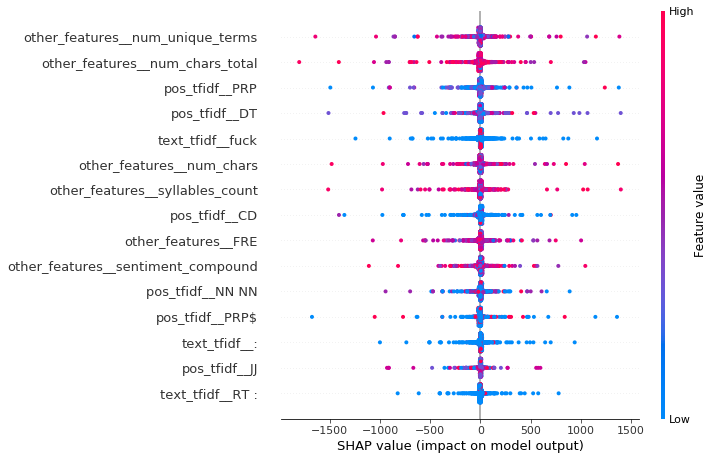

In [20]:
shap.summary_plot(shap_values[1], X_test_tr, feature_names=feature_names, max_display=15)

In [14]:
print(classification_report(y_test, preds, target_names=classes))

              precision    recall  f1-score   support

     abusive       0.86      0.78      0.82      9002
     hateful       0.58      0.10      0.17      1602
      normal       0.77      0.93      0.84     17800
        spam       0.64      0.20      0.30      4595

   micro avg       0.79      0.75      0.77     32999
   macro avg       0.71      0.50      0.54     32999
weighted avg       0.77      0.75      0.73     32999
 samples avg       0.75      0.75      0.75     32999



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels.



In [30]:
X, Y, classes, df = get_toxic_comments_dataset()
# selected = df.loc[np.logical_or(
#     df['severe_toxic'] == 1,
#     np.logical_and.reduce([df['toxic'] == 0, df['obscene'] == 0, df['threat'] == 0, df['insult'] == 0, df['identity_hate'] == 0])
# )]
# X = selected['comment_text']
# Y = selected['severe_toxic'].astype(int).values

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=0)
p = cu.get_pipeline()
p.fit(X_train, y_train)
preds_proba = p.predict_proba(X_test)
preds = np.array([(preds_proba[i][:, 1] > 0.5).astype(int) for i in range(len(classes))]).T
print(classification_report(y_test, preds, target_names=classes))

# p.fit(X, Y)
pickle.dump((p, classes), open('model_toxic_comments_dataset.p', 'wb'))

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels.



               precision    recall  f1-score   support

        toxic       0.93      0.55      0.69      5072
 severe_toxic       0.56      0.06      0.11       547
      obscene       0.91      0.60      0.73      2794
       threat       0.44      0.03      0.05       152
       insult       0.83      0.44      0.58      2625
identity_hate       0.62      0.03      0.05       481

    micro avg       0.90      0.49      0.63     11671
    macro avg       0.72      0.29      0.37     11671
 weighted avg       0.87      0.49      0.61     11671
  samples avg       0.05      0.04      0.04     11671



In [46]:
X, Y, classes = get_hate_offensive_speech_dataset()
# selected = df.loc[np.logical_or(
#     df['severe_toxic'] == 1,
#     np.logical_and.reduce([df['toxic'] == 0, df['obscene'] == 0, df['threat'] == 0, df['insult'] == 0, df['identity_hate'] == 0])
# )]
# X = selected['comment_text']
# Y = selected['severe_toxic'].astype(int).values

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=0)
p = cu.get_pipeline()
p.fit(X_train, y_train)
preds_proba = p.predict_proba(X_test)
preds = np.array([(preds_proba[i][:, 1] > 0.5).astype(int) for i in range(len(classes))]).T
print(classification_report(y_test, preds, target_names=classes))

# p.fit(X, Y)
pickle.dump((p, classes), open('model_hate_offensive_speech_dataset.p', 'wb'))

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels.



              precision    recall  f1-score   support

        hate       0.50      0.05      0.09       475
   offensive       0.91      0.97      0.94      6311
     neither       0.88      0.74      0.80      1393

   micro avg       0.90      0.88      0.89      8179
   macro avg       0.76      0.59      0.61      8179
weighted avg       0.88      0.88      0.87      8179
 samples avg       0.88      0.88      0.88      8179



In [47]:
X, Y, classes = get_harassment_umd_dataset()
# Collapse abuse and hate classes and remove spam
# sel = np.logical_or.reduce([Y[:, 0], Y[:, 1], Y[:, 2]])
# X = X[sel]
# Y = Y[sel]
# Y = np.logical_or(Y[:, 0], Y[:, 1])

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=0)
p = cu.get_pipeline()
p.fit(X_train, y_train)
preds_proba = p.predict_proba(X_test)[:, 1]
preds = (preds_proba > 0.5).astype(int)
print(classification_report(y_test, preds))

p.fit(X, Y)
pickle.dump((p, classes), open('model_harassment_umd_dataset.p', 'wb'))

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.



              precision    recall  f1-score   support

           0       0.78      0.96      0.86      5024
           1       0.63      0.21      0.31      1695

    accuracy                           0.77      6719
   macro avg       0.71      0.58      0.59      6719
weighted avg       0.74      0.77      0.72      6719



In [ ]:
p = cu.get_clf()
scoring = ['f1_weighted', 'precision_weighted', 'recall_weighted']
scores = cross_validate(p, XX, Y, scoring=scoring, cv=5, return_train_score=False)
for t in scoring:
    s = scores['test_' + t]
    print(t, str(round(s.mean(), 3)), end='\t')
print()

In [22]:
df = pd.read_csv("../data/datasets/hatespeech_offensive/labeled_data.csv")

In [27]:
df = pd.read_csv("../data/datasets/hate_abuse_speech/hatespeech_text_label_vote.csv", sep='\t', header=None, names=['text', 'label', 'votes'])
X = df['text']
Y = pd.get_dummies(df['label'])

In [29]:
df = pd.read_csv("../data/datasets/toxic_comment/train.csv")

In [5]:

tweets = df.tweet

X = tweets.values
y = df['class'].astype(int)

In [3]:
df = pd.read_csv('../data/toxic_comment/train.csv')
X = df['comment_text']
y = df[['severe_toxic', 'toxic']].astype(int)

In [21]:
f_transormer = cu.get_feature_transformers()
# f_transormer

In [ ]:
f_transormer.fit(X, y)

In [23]:
XX = f_transormer.transform(X)

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.



feel the might of cyber apocalypse yyyyyyyyyyyyyyybvgtfrrrrrbyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyyy

In [26]:
pickle.dump((XX, y, f_transormer), open('temp.p', 'wb'))

In [4]:
p = cu.get_pipeline()


_ = p.fit(X, y)

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:300: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.



In [42]:
p = cu.get_clf()
# X = XX[:1000]
# y = y.head(1000)

In [43]:
p.fit(XX, y)

Pipeline(memory=None,
     steps=[('clf', RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False))])

In [17]:
scoring = ['f1_weighted', 'precision_weighted', 'recall_weighted']
scores = cross_validate(p, XX, y, scoring=scoring, cv=5, return_train_score=False)
# print(clf_type + '_' + comparison, end='\t')
for t in scoring:
    s = scores['test_' + t]
    print(t, str(round(s.mean(), 3)), end='\t')
print()

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:922: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



f1_weighted 0.987	precision_weighted 0.99	recall_weighted 0.985	


In [5]:
preds = p.predict_proba([
    'COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK', 
    'You are a know it all.....Jimbo! Why don\'t you get a life instead of sitting in front of your computer all day. The high priestess of knowledge, indeed!',
    'DISLIKE RACISM AND I CAN SEE THAT YOU HAS PROBLEMS WITH PEOPLE WHO SPEAKS SPANISH. YOU ARE AN ANTISEMITE TOO.'
])

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.



In [6]:
preds

[array([[0.4, 0.6],
        [1. , 0. ],
        [1. , 0. ]]), array([[0.05, 0.95],
        [0.15, 0.85],
        [0.  , 1.  ]])]

In [73]:
[p[0] for p in preds]

[array([0.35, 0.65]), array([0.05, 0.95])]

In [9]:
harrasser_user_stats = {}
for f in glob.glob("user_tweets/*.p"):
    uid = int(re.findall(r'\d+', f)[0])
    if uid in harrasser_user_stats.keys():
        continue
    tweets = pickle.load(open(f, 'rb'))
    
        
    to_predict = []
    for t in tweets:
        if t.in_reply_to_screen_name is not None and len(cu.preprocess(t.text).strip()) > 0:
            to_predict.append(t.text)
    if len(to_predict) > 0:
#         preds = p.predict_proba(f_transormer.transform(to_predict))
        preds = p.predict_proba(to_predict)
        print(np.array(to_predict)[preds[0][:, 1] > 0.5])
#         print(np.array(to_predict)[preds[1][:, 1] > 0.5])
        harrasser_user_stats[uid] = [preds[0].mean(axis=0)[1], preds[1].mean(axis=0)[1]]
        
        print(harrasser_user_stats[uid])
    

[]
[0.004006243496357953, 0.07510405827263235]
[]
[0.018498049414824618, 0.07129388816644894]
[]
[0.007317073170731707, 0.14146341463414633]
[]
[0.004939981532779311, 0.08734995383194752]
[]
[0.0036458333333333334, 0.06869212962962973]
[]
[0.006499575191163961, 0.05059473237043326]
[]
[0.006549520766773153, 0.1113418530351433]
[]
[0.014308553157474004, 0.1925659472422056]
[]
[0.004180602006688965, 0.07224080267558547]
[]
[0.006440281030444951, 0.0880562060889921]
[]
[0.013888888888888883, 0.09621212121212129]
[]
[0.0021008403361344537, 0.037114845938375364]
[]
[0.0038844149692088977, 0.08747039317858833]
[]
[0.03333333333333333, 0.21666666666666667]
[]
[0.006060606060606061, 0.06212121212121213]
[]
[0.0, 0.15]
[]
[0.038124999999999964, 0.1268749999999999]
[]
[0.02112171837708844, 0.08764916467780418]
[]
[0.0, 0.05789473684210527]
[]
[0.009824957651044653, 0.053514963297571404]
[]
[0.006960049937578043, 0.07427382438618316]
[]
[0.005901639344262298, 0.06590163934426242]
[]
[0.0028606965

[]
[0.0034999999999999996, 0.08649999999999997]
[]
[0.00706064630367422, 0.12651615759185555]
[]
[0.006423010380622863, 0.10436851211072726]
[]
[0.004360967184801375, 0.05837651122625179]
[]
[0.0024725274725274724, 0.07857142857142865]
[]
[0.03674698795180722, 0.14698795180722887]
[]
[0.009042325780248012, 0.11507054296708082]
[]
[0.009642857142857184, 0.08721861471861381]
[]
[0.004903036955726318, 0.057299670691547726]
[]
[0.007258064516129036, 0.06350806451612909]
[]
[0.005863956215793611, 0.08186082877247909]
[]
[0.008536585365853657, 0.06227642276422764]
[]
[0.003725490196078432, 0.03921568627450983]
[]
[0.0036684782608695666, 0.06385869565217404]
[]
[0.0, 0.0]
[]
[0.010809426229508206, 0.1182889344262289]
[]
[0.0045000000000000005, 0.06750000000000003]
[]
[0.006551724137931029, 0.07220689655172408]
[]
[0.004970414201183425, 0.032485207100591856]
[]
[0.0, 0.027777777777777776]
[]
[0.009779614325068861, 0.10674931129476593]
[]
[0.005420560747663543, 0.07577102803738288]
[]
[0.006446

[]
[0.011538461538461537, 0.07692307692307693]
[]
[0.010436893203883496, 0.15024271844660214]
[]
[0.005, 0.02]
[]
[0.011232349165596914, 0.1413350449293962]
[]
[0.004986702127659571, 0.10664893617021233]
[]
[0.00808270676691728, 0.05666118421052613]
[]
[0.010864505403158819, 0.1311986699916882]
[]
[0.00816326530612245, 0.09693877551020405]
[]
[0.011261261261261257, 0.1903153153153153]
[]
[0.004454545454545448, 0.08812121212121188]
[]
[0.004281767955801098, 0.09575276243093882]
[]
[0.011194029850746268, 0.12014925373134325]
[]
[0.005, 0.06636363636363632]
[]
[0.011154855643044605, 0.11391076115485575]
[]
[0.01857682619647358, 0.20056675062972257]
[]
[0.007796101949025505, 0.12926036981509348]
[]
[0.010499999999999992, 0.06262500000000017]
[]
[0.0044444444444444444, 0.07555555555555554]
[]
[0.018774703557312315, 0.20897562582345341]
[]
[0.03947368421052634, 0.14078947368421058]
[]
[0.008643457382953194, 0.12070828331332562]
[]
[0.007453596287703036, 0.0741299303944314]
[]
[0.006889352818

[]
[0.015587044534412927, 0.09514170040485825]
[]
[0.007960199004975122, 0.1257131011608623]
[]
[0.00856129685916919, 0.11838905775075925]
['@DeanObeidallah Go fuck yourself 👍🇺🇸' '@neiltyson Go fuck yourself.']
[0.01448770491803281, 0.16629098360655914]
[]
[0.006876278118609417, 0.1072341513292436]
[]
[0.005442176870748299, 0.07800453514739242]
[]
[0.0110978520286396, 0.07183770883054917]
[]
[0.007011070110701111, 0.1001845018450186]
[]
[0.02425690021231441, 0.07616772823779186]
[]
[0.004211956521739132, 0.07880434782608717]
[]
[0.008333333333333338, 0.12442528735632209]
[]
[0.004545454545454546, 0.07272727272727274]
[]
[0.010360360360360362, 0.0756756756756757]
[]
[0.0101458080194411, 0.06886391251518773]
[]
[0.007009345794392525, 0.12056074766355158]
[]
[0.011839481555334073, 0.14055957128614255]
[]
[0.0076530612244897975, 0.0928571428571428]
[]
[0.0037037037037037047, 0.051010101010101075]
[]
[0.006311274509803911, 0.04589460784313733]
[]
[0.0049382716049382715, 0.08827160493827155]

[]
[0.002764705882352941, 0.05629411764705875]
[]
[0.013795255930087418, 0.08732833957553049]
[]
[0.007641196013289032, 0.1284468438538208]
[]
[0.008793103448275863, 0.1348275862068967]
[]
[0.004567307692307693, 0.0855769230769232]
[]
[0.010655737704918032, 0.09508196721311472]
[]
[0.007259158751696056, 0.0582767978290367]
[]
[0.0029411764705882366, 0.0860859728506788]
[]
[0.03391946992864355, 0.09854740061161979]
[]
[0.004763104838709677, 0.07373991935483855]
[]
[0.004449541284403663, 0.09798165137614614]
[]
[0.0, 0.16875]
[]
[0.005514385353095048, 0.08177855274629485]
[]
[0.01390041493775932, 0.09543568464730305]
[]
[0.005194805194805195, 0.06558441558441555]
[]
[0.005705275229357803, 0.08609518348623821]
[]
[0.007183364839319456, 0.05997164461247618]
[]
[0.0, 0.07500000000000001]
[]
[0.0058823529411764705, 0.10784313725490197]
[]
[0.0, 0.1]
[]
[0.005555555555555554, 0.09988662131519264]
[]
[0.0034285714285714284, 0.041999999999999954]
[]
[0.013362068965517246, 0.09655172413793107]
[

[]
[0.007026086956521775, 0.10884521739130591]
[]
[0.017647058823529415, 0.11666666666666664]
[]
[0.01129160063391445, 0.12464342313787624]
[]
[0.012681159420289861, 0.09818840579710147]
[]
[0.006073752711496744, 0.12169197396963105]
[]
[0.010031847133757958, 0.14785031847133756]
[]
[0.008933454876937095, 0.1381494986326342]
[]
[0.008563899868247718, 0.13359079929732137]
[]
[0.006672760511883002, 0.04782145033516117]
[]
[0.005412844036697247, 0.07135321100917445]
['@KThomasDC @davidplouffe Fuck you, you lying piece of shit.😡']
[0.014666666666666665, 0.14133333333333348]
[]
[0.004302073661405132, 0.08662952646239501]
[]
[0.009443099273607744, 0.11853107344632764]
['@PoliDiceTweets Go fuck yourself.']
[0.003899204244031824, 0.07220159151193575]
[]
[0.008804523424878825, 0.12342487883683345]
[]
[0.009742300439974894, 0.06115650534255112]
[]
[0.006137184115523466, 0.11371841155234674]
[]
[0.010641025641025705, 0.13783333333333408]
[]
[0.004190476190476191, 0.08095238095238087]
[]
[0.006582

[]
[0.00901287553648069, 0.08637339055794006]
[]
[0.012500000000000018, 0.10893734452736258]
[]
[0.011040557148709612, 0.20366653011061256]
[]
[0.016904761904762037, 0.09840136054421691]
[]
[0.005389541088580568, 0.08100320170757704]
[]
[0.0, 0.07]
[]
[0.0015748031496062994, 0.038582677165354295]
[]
[0.0059870550161812254, 0.06707119741100324]
[]
[0.0024844720496894407, 0.06118012422360248]
[]
[0.01341212744090444, 0.12995889003083164]
[]
[0.007282741738066117, 0.1164422684618534]
[]
[0.010559440559440546, 0.14083916083916037]
[]
[0.010013440860215043, 0.1542338709677414]
[]
[0.01247906197654944, 0.13002512562814053]
[]
[0.00986328124999999, 0.1416992187499998]
[]
[0.010526315789473667, 0.14894736842105225]
[]
[0.004357142857142855, 0.06571428571428566]
[]
[0.004627766599597586, 0.08329979879275654]
[]
[0.006864947965941356, 0.08062913907284774]
[]
[0.006021897810218975, 0.11532846715328451]
[]
[0.01064581231079718, 0.12649175916582506]
[]
[0.007279029462738288, 0.08918977469670661]
[]

[]
[0.005166880616174597, 0.09776155327342875]
[]
[0.012121212121212123, 0.17601010101010117]
[]
[0.0038659793814433013, 0.07268041237113418]
[]
[0.006970453599667111, 0.09885559717020444]
[]
[0.019417475728155328, 0.11941747572815531]
[]
[0.008435754189944116, 0.10589385474860252]
[]
[0.017598684210526315, 0.15065789473684194]
[]
[0.00924869234427014, 0.10763195435092786]
[]
[0.009531013615733747, 0.11985627836611186]
[]
[0.0288888888888889, 0.1466666666666666]
[]
[0.00840236686390531, 0.1368343195266269]
[]
[0.006609195402298847, 0.08084291187739467]
['@DaveColePhoto HEY FUCK YOU PAL\n\n1/459']
[0.004387186629526456, 0.08384401114206073]
[]
[0.009511343804537515, 0.14563699825479864]
[]
[0.008666367310282936, 0.08816793893129811]
[]
[0.0030254777070063705, 0.07707006369426768]
[]
[0.008159722222222216, 0.08854311342592584]
[]
[0.01448736998514116, 0.07526002971768213]
[]
[0.0022922636103151865, 0.03581661891117483]
[]
[0.005637707948243991, 0.08086876155268014]
[]
[0.0090909090909090

[]
[0.008405172413793096, 0.09665948275862057]
[]
[0.016666666666666666, 0.06666666666666667]
[]
[0.02822153574580736, 0.25334657252133125]
[]
[0.001844262295081968, 0.052686703096539146]
[]
[0.008888888888888889, 0.1196296296296296]
[]
[0.022162576687116586, 0.23796012269938654]
[]
[0.0046875000000000016, 0.06796875000000015]
[]
[0.0037709497206703927, 0.08233240223463703]
[]
[0.0178082191780822, 0.07328767123287662]
[]
[0.01454210768522786, 0.16378278877128616]
[]
[0.02395709177592389, 0.11168057210965354]
[]
[0.03604240282685496, 0.09982332155476882]
[]
[0.009339887640449426, 0.11908239700374493]
[]
[0.0049382716049382715, 0.07037037037037029]
[]
[0.009023517382413136, 0.13591371279254888]
[]
[0.02948148148148088, 0.08906172839506087]
[]
[0.0024489795918367346, 0.06709183673469392]
[]
[0.006666666666666667, 0.07666666666666667]
[]
[0.006827956989247348, 0.10553763440860323]
[]
[0.00625, 0.0625]
[]
[0.007729468599033815, 0.08599033816425129]
[]
[0.004166666666666667, 0.10833333333333

[]
[0.00415637860082304, 0.08300411522633695]
[]
[0.009340148698884762, 0.11493959107806626]
[]
[0.00751748251748251, 0.07399475524475492]
[]
[0.00819209039548023, 0.06468926553672319]
[]
[0.007712765957446806, 0.09587765957446813]
[]
[0.009383886255924173, 0.11145023696682409]
[]
[0.0015625000000000005, 0.03837384259259273]
[]
[0.0, 0.022727272727272728]
[]
[0.0035714285714285718, 0.05714285714285715]
[]
[0.0, 0.1142857142857143]
[]
[0.01053958648512361, 0.09538577912254174]
[]
[0.0, 0.0625]
[]
[0.005255023183925809, 0.08292117465224098]
[]
[0.028897715988083696, 0.09826216484607593]
[]
[0.004980079681274902, 0.0452191235059761]
[]
[0.0076086956521739125, 0.12065217391304343]
[]
[0.008518518518518509, 0.10671957671957616]
[]
[0.004193548387096774, 0.09655913978494633]
[]
[0.0030647985989492137, 0.04150612959719804]
['@McDonaldsCorp FUCK YOU!!!!']
[0.014366692728694301, 0.1871725957779538]
[]
[0.01302742616033757, 0.1515295358649785]
[]
[0.00806451612903226, 0.1025806451612904]
[]
[0.0

[]
[0.009435028248587555, 0.09276836158192034]
[]
[0.0, 0.07999999999999999]
[]
[0.01129032258064516, 0.11935483870967739]
[]
[0.005245428296438873, 0.09215591915303105]
[]
[0.0, 0.0]
[]
[0.006275862068965532, 0.09706896551724177]
[]
[0.006168224299065412, 0.09406542056074708]
[]
[0.015078125000000001, 0.1989114583333327]
[]
[0.004725897920604931, 0.0974007561436684]
[]
[0.009392857142857161, 0.11182142857142832]
[]
[0.017698412698412797, 0.15625661375661407]
[]
[0.01081349206349205, 0.1647817460317456]
[]
[0.03587570621468952, 0.09770872567482772]
[]
[0.012137486573576864, 0.11245972073039769]
[]
[0.0016666666666666666, 0.039791666666666656]
[]
[0.010022650056625134, 0.1621177802944506]
[]
[0.01282258064516127, 0.0977016129032256]
[]
[0.0, 0.0]
[]
[0.005693069306930683, 0.10870462046204553]
[]
[0.0072580645161290265, 0.09049518958686979]
[]
[0.011111111111111115, 0.1993464052287582]
[]
[0.017148014440433207, 0.19765342960288795]
[]
[0.009818181818181847, 0.17372777777777879]
[]
[0.0, 

[]
[0.004880136986301368, 0.06969178082191789]
[]
[0.007131474103585653, 0.12965737051792844]
[]
[0.011100447856685914, 0.11116442738323715]
[]
[0.006914893617021275, 0.11117021276595744]
[]
[0.008300466116887813, 0.11930919086889118]
[]
[0.006249999999999997, 0.09067049808429087]
[]
[0.009794437726723084, 0.1437726723095521]
[]
[0.015116279069767464, 0.17760097919216833]
[]
[0.003703703703703704, 0.07962962962962965]
[]
[0.017375886524822685, 0.19231678486997633]
[]
[0.0, 0.049999999999999475]
[]
[0.01699684826654659, 0.17872579918955672]
[]
[0.00822559072670534, 0.08704859563085184]
[]
[0.009216745442268758, 0.15005908170155333]
[]
[0.003448275862068966, 0.03448275862068966]
['@KathrynDelilahh FUCK I meant *fuck... fuck.']
[0.012605042016806716, 0.15875350140055983]
[]
[0.004861111111111112, 0.07170138888888905]
[]
[0.01288209606986901, 0.15701419213973758]
[]
[0.005966930265995709, 0.07918763479511193]
[]
[0.006915509259259268, 0.10616319444444462]
[]
[0.008593749999999999, 0.075781

[]
[0.004682274247491641, 0.09648829431438147]
[]
[0.012998740025199547, 0.17234355312893962]
[]
[0.006308724832214761, 0.09597315436241574]
[]
[0.01058315334773221, 0.14168466522678236]
[]
[0.00625, 0.07500000000000001]
[]
[0.009482758620689653, 0.07241379310344825]
[]
[0.009901800327332271, 0.14626295690125568]
[]
[0.0035361842105263164, 0.06792763157894728]
[]
[0.003525641025641024, 0.09762820512820504]
[]
[0.0031043593130779335, 0.05346763540290582]
[]
[0.013598074608904945, 0.08686823104693105]
[]
[0.016348448687350883, 0.1648498408910098]
[]
[0.0036486486486486435, 0.12123123123123089]
[]
[0.01580631399317408, 0.18508105802047978]
[]
[0.008228980322003566, 0.066279069767442]
[]
[0.0029411764705882353, 0.17647058823529413]
[]
[0.004301075268817206, 0.07580645161290327]
[]
[0.007592592592592582, 0.08398148148148148]
[]
[0.004651162790697672, 0.07151162790697671]
['@RamirezJaneIam Go fuck yourself.']
[0.012533875338753381, 0.13658988256549195]
[]
[0.007200484066155746, 0.05904598628

In [94]:
len(control_user_stats), len(harrasser_user_stats)

(40, 427)

In [111]:

#override tweepy.StreamListener to add logic to on_status
class MyStreamListener(tweepy.StreamListener):
    
    def __init__(self):
        super(MyStreamListener, self).__init__()
        self.users = []
        
    def on_status(self, status):
        if status.user.statuses_count > 3200:
            self.users.append(status.user)
            print(len(self.users))
            if len(self.users) > 500:
                return False
        return True

In [112]:
myStreamListener = MyStreamListener()
myStream = tweepy.Stream(auth = api.auth, listener=myStreamListener)

NameError: name 'api' is not defined

In [106]:
myStream.sample(languages=['en'])

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [107]:
myStream.disconnect()

In [108]:
len(myStreamListener.users)

501

In [10]:
control_user_stats = {}
for f in glob.glob("control_user_tweets/*.p"):
    tweets = pickle.load(open(f, 'rb'))
    uid = int(re.findall(r'\d+', f)[0])
    
    harrassment_count = 0
    offensive_count = 0
    count = 0
    to_predict = []
    for t in tweets:
        if t.in_reply_to_screen_name is not None and len(cu.preprocess(t.text).strip()) > 0:
            to_predict.append(t.text)
    if len(to_predict) > 0:
        preds = p.predict_proba(to_predict)
        print(np.array(to_predict)[preds[0][:, 1] > 0.5])
        control_user_stats[uid] = [preds[0].mean(axis=0)[1], preds[1].mean(axis=0)[1]]
        
        print(control_user_stats[uid])

[]
[0.017964071856287418, 0.18233532934131755]
[]
[0.0, 0.075]
[]
[0.005083732057416262, 0.09796650717703288]
[]
[0.010606060606060601, 0.11941287878787893]
[]
[0.0065945716709075695, 0.09836019225332245]
[]
[0.009474327628361891, 0.1388019559902204]
[]
[0.015243902439024406, 0.18749999999999978]
[]
[0.010610932475884243, 0.08086816720257257]
[]
[0.012942191544434876, 0.17316652286453862]
[]
[0.009762711864406803, 0.15552542372881403]
[]
[0.009271708683473412, 0.1372408963585441]
[]
[0.0041136873597606635, 0.08474195961107008]
[]
[0.01334951456310679, 0.16407766990291267]
[]
[0.011111111111111112, 0.13333333333333333]
[]
[0.005192878338278934, 0.11691394658753722]
['@softbuntae fuck you bro, that hurts']
[0.014483627204030215, 0.16095717884130972]
[]
[0.007352941176470588, 0.10147058823529406]
[]
[0.009004739336492892, 0.14857819905213293]
[]
[0.018110236220472448, 0.15551181102362216]
[]
[0.010078534031413606, 0.12133507853403143]
[]
[0.009887005649717517, 0.18474576271186455]
[]
[0.0

[]
[0.0074218750000000005, 0.08632812500000013]
[]
[0.01126760563380282, 0.12253521126760565]
[]
[0.006100795755968163, 0.10179045092838163]
['@MisterJaredGray FUCK!!! I even double checked the date']
[0.007941929974380875, 0.12169086251067422]
[]
[0.008670520231213874, 0.11156069364161865]
[]
[0.005535714285714287, 0.10392857142857162]
[]
[0.02443502824858757, 0.2818502824858752]
[]
[0.01111304954640622, 0.11362526168876669]
[]
[0.005800575263662503, 0.08029721955896404]
[]
[0.008064516129032258, 0.182258064516129]
[]
[0.003409090909090909, 0.09431818181818179]
[]
[0.01049830672472188, 0.09121915820029043]
[]
[0.005555555555555557, 0.07222222222222224]
[]
[0.005405405405405406, 0.06621621621621625]
['@Magnusbabexx FUCK YOU']
[0.023214285714285705, 0.2175595238095235]
[]
[0.008823529411764707, 0.06985294117647056]
[]
[0.0069767441860465115, 0.10465116279069765]
['@xFlameOfLust doms suck dick too 😔']
[0.00760219341974079, 0.13697657028913318]
['@Neon__Xenon You suck fuck']
[0.0097754293

In [8]:
py.iplot([
#     go.Histogram(x=[u[0] for u in harrasser_user_stats.values()], name='H - Harrassment', histnorm='probability'),
#     go.Histogram(x=[u[1] for u in harrasser_user_stats.values()], name='H - Offencive Lang.', histnorm='probability'),
    go.Histogram(x=[u[0] for u in control_user_stats.values()], name='C - Harrassment', histnorm='probability'),
#     go.Histogram(x=[u[1] for u in control_user_stats.values()], name='C - Offencive Lang.', histnorm='probability')
])

In [67]:
df = pd.read_csv('hatespeech_labels.csv')
control_tweet_ids = list(df.loc[df['label'] == 'normal']['tweet_id'].values)

In [103]:
auth = tweepy.OAuthHandler('QLbvBAuKCD9GOSMzM4ly3Jueb', '9qX5Suoeuoyccict1tkbCheJC42djHrIu71pL0GYnxw1DEhSSp')
auth.set_access_token('430684463-hPPEVIKcDIiLGqxw37XuYRgvXNxIBXHO9NZeYz3o', 'GZ8K5u3SLjdWvXPHSrgfWfyvpAkfKLr8csFo80UBECZ5h')
api = tweepy.API(auth)

In [59]:
len(control_tweet_ids)

53790

In [74]:
control_tweets = []
for i in range(int(len(control_tweet_ids) / 100) - 1):
    print(i)
    control_tweets.extend(api.statuses_lookup(control_tweet_ids[i * 100 : (i + 1) * 100]))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22



KeyboardInterrupt



In [75]:
len(control_tweets)

1434

In [80]:
control_users = set()
for t in control_tweets:
    control_users.add((t.user.id, t.user.screen_name))

In [124]:
scanned_ids = [int(re.findall(r'\d+', f)[0]) for f in glob.glob("../data/control_user_tweets2/*.p")]

In [125]:
len(scanned_ids)

155

In [116]:
failed = []

In [115]:
def get_all_tweets(screen_name):
    alltweets = []
    new_tweets = api.user_timeline(screen_name=screen_name,count=200)

    #save most recent tweets
    alltweets.extend(new_tweets)
    if len(alltweets) == 0:
        return alltweets
    
    #save the id of the oldest tweet less one
    oldest = alltweets[-1].id - 1

    #keep grabbing tweets until there are no tweets left to grab
    while len(new_tweets) > 0:
        print("getting tweets before %s" % (oldest))

        #all subsiquent requests use the max_id param to prevent duplicates
        new_tweets = api.user_timeline(screen_name = screen_name,count=200,max_id=oldest)

        #save most recent tweets
        alltweets.extend(new_tweets)

        #update the id of the oldest tweet less one
        oldest = alltweets[-1].id - 1

        print("...%s tweets downloaded so far" % (len(alltweets)))
    return alltweets

In [126]:
for u in myStreamListener.users:
    i = u.id
    print(i)
    if i in scanned_ids or i in failed:
        continue
    try:
        tweets = get_all_tweets(u.screen_name)
        pickle.dump(tweets, open('../data/control_user_tweets2/' + str(i) + '.p', 'wb'))
    except tweepy.RateLimitError:
        time.sleep(15 * 60)
    except Exception as e:
        print(e)
        failed.append(i)

3304008672
getting tweets before 1200449766339076095
...390 tweets downloaded so far
getting tweets before 1200039232540151807
...583 tweets downloaded so far
getting tweets before 1199783678710337536
...783 tweets downloaded so far
getting tweets before 1198955205431300095
...982 tweets downloaded so far
getting tweets before 1197503670616838144
...1182 tweets downloaded so far
getting tweets before 1197422289819750399
...1382 tweets downloaded so far
getting tweets before 1196057924533141503
...1581 tweets downloaded so far
getting tweets before 1195413404787335167
...1781 tweets downloaded so far
getting tweets before 1194602668460793856
...1980 tweets downloaded so far
getting tweets before 1193898005621092351
...2180 tweets downloaded so far
getting tweets before 1193327133113929728
...2372 tweets downloaded so far
getting tweets before 1193071779364900864
...2571 tweets downloaded so far
getting tweets before 1192792065970778111
...2771 tweets downloaded so far
getting tweets bef

...2197 tweets downloaded so far
getting tweets before 1175865032267173888
...2395 tweets downloaded so far
getting tweets before 1174131258944868351
...2593 tweets downloaded so far
getting tweets before 1172931219882946559
...2792 tweets downloaded so far
getting tweets before 1172318223355674623
...2990 tweets downloaded so far
getting tweets before 1171811329520427007
...3189 tweets downloaded so far
getting tweets before 1169337192008703999
...3200 tweets downloaded so far
getting tweets before 1169329092359073792
...3200 tweets downloaded so far
354938495
getting tweets before 1118598299194482689
...396 tweets downloaded so far
getting tweets before 993252460784472064
...593 tweets downloaded so far
getting tweets before 885569005351784453
...792 tweets downloaded so far
getting tweets before 825824107874877443
...991 tweets downloaded so far
getting tweets before 771501572723445759
...1184 tweets downloaded so far
getting tweets before 716791812657192962
...1366 tweets downloade

...3136 tweets downloaded so far
466600982
getting tweets before 1196011082189393919
...400 tweets downloaded so far
getting tweets before 1193761238750126080
...600 tweets downloaded so far
getting tweets before 1186522601570484224
...799 tweets downloaded so far
getting tweets before 1158172950656356353
...999 tweets downloaded so far
getting tweets before 1148102545379942400
...1199 tweets downloaded so far
getting tweets before 1136739460929007615
...1399 tweets downloaded so far
getting tweets before 1124507735599529985
...1593 tweets downloaded so far
getting tweets before 1112217755850338303
...1792 tweets downloaded so far
getting tweets before 1102759753577652224
...1986 tweets downloaded so far
getting tweets before 1095435727796609024
...2182 tweets downloaded so far
getting tweets before 1084593146418335743
...2378 tweets downloaded so far
getting tweets before 1073062719761334271
...2566 tweets downloaded so far
getting tweets before 1060957549778948095
...2757 tweets down

...3201 tweets downloaded so far
726566276
getting tweets before 1187039549983219719
...381 tweets downloaded so far
getting tweets before 1170233328315916287
...575 tweets downloaded so far
getting tweets before 1157734103220965386
...765 tweets downloaded so far
getting tweets before 1146867764591824895
...947 tweets downloaded so far
getting tweets before 1136032259448942591
...1134 tweets downloaded so far
getting tweets before 1126500841697841152
...1327 tweets downloaded so far
getting tweets before 1118944760742469631
...1519 tweets downloaded so far
getting tweets before 1048696242770006015
...1715 tweets downloaded so far
getting tweets before 994319031871201279
...1909 tweets downloaded so far
getting tweets before 976507677433126911
...2098 tweets downloaded so far
getting tweets before 955205153258426367
...2276 tweets downloaded so far
getting tweets before 936667436929167359
...2462 tweets downloaded so far
getting tweets before 901517843661037567
...2636 tweets downloade

...1567 tweets downloaded so far
getting tweets before 923068851746611199
...1739 tweets downloaded so far
getting tweets before 867475609793871871
...1911 tweets downloaded so far
getting tweets before 813122925205200895
...2103 tweets downloaded so far
getting tweets before 743209157549948927
...2273 tweets downloaded so far
getting tweets before 692270358515355649
...2415 tweets downloaded so far
getting tweets before 673964548454416383
...2558 tweets downloaded so far
getting tweets before 665417974816350207
...2715 tweets downloaded so far
getting tweets before 642237984553631743
...2914 tweets downloaded so far
getting tweets before 260914574365171711
...2943 tweets downloaded so far
getting tweets before 243538634735775747
...2943 tweets downloaded so far
1050560570120900610
getting tweets before 1191818781775056897
...400 tweets downloaded so far
getting tweets before 1182322399804624903
...600 tweets downloaded so far
getting tweets before 1173663321557544962
...800 tweets dow

...2857 tweets downloaded so far
getting tweets before 1172521699583123457
...3043 tweets downloaded so far
getting tweets before 1165756078270889983
...3066 tweets downloaded so far
getting tweets before 1164246972523524095
...3066 tweets downloaded so far
1080971752354791424
getting tweets before 1200511515113197567
...400 tweets downloaded so far
getting tweets before 1200327416549453823
...600 tweets downloaded so far
getting tweets before 1200144670644482058
...799 tweets downloaded so far
getting tweets before 1199964261923115007
...999 tweets downloaded so far
getting tweets before 1199603033740578815
...1199 tweets downloaded so far
getting tweets before 1199424559000309759
...1398 tweets downloaded so far
getting tweets before 1199240857091739647
...1596 tweets downloaded so far
getting tweets before 1199059729319944193
...1795 tweets downloaded so far
getting tweets before 1198880631352168447
...1994 tweets downloaded so far
getting tweets before 1198769957137465345
...2190 t

...986 tweets downloaded so far
getting tweets before 1178089876786487297
...1183 tweets downloaded so far
getting tweets before 1174716007560208383
...1381 tweets downloaded so far
getting tweets before 1171933817545908223
...1573 tweets downloaded so far
getting tweets before 1168688114656788479
...1764 tweets downloaded so far
getting tweets before 1165261683050385408
...1961 tweets downloaded so far
getting tweets before 1160340981885149183
...2152 tweets downloaded so far
getting tweets before 1157383273942781951
...2348 tweets downloaded so far
getting tweets before 1155037080692699135
...2539 tweets downloaded so far
getting tweets before 1149472097992769536
...2735 tweets downloaded so far
getting tweets before 1146363257541844996
...2923 tweets downloaded so far
getting tweets before 1142968833248059397
...3118 tweets downloaded so far
getting tweets before 1140270359972917249
...3142 tweets downloaded so far
getting tweets before 1139926517658595327
...3142 tweets downloaded 

...2395 tweets downloaded so far
getting tweets before 1192294619524059142
...2595 tweets downloaded so far
getting tweets before 1191414746932817925
...2795 tweets downloaded so far
getting tweets before 1190413334987849727
...2995 tweets downloaded so far
getting tweets before 1189595915620933632
...3194 tweets downloaded so far
getting tweets before 1188980604290977792
...3242 tweets downloaded so far
getting tweets before 1188894089472827391
...3242 tweets downloaded so far
731529153602670593
getting tweets before 1184801549811376127
...399 tweets downloaded so far
getting tweets before 1167781486990245887
...594 tweets downloaded so far
getting tweets before 1164197116845051906
...793 tweets downloaded so far
getting tweets before 1163809902357123072
...993 tweets downloaded so far
getting tweets before 1163363912160432128
...1191 tweets downloaded so far
getting tweets before 1162930166235926527
...1387 tweets downloaded so far
getting tweets before 1162655421359775744
...1584 tw

...1375 tweets downloaded so far
getting tweets before 1182708422376116223
...1568 tweets downloaded so far
getting tweets before 1179961841491087362
...1755 tweets downloaded so far
getting tweets before 1178672164234579968
...1948 tweets downloaded so far
getting tweets before 1176995966290976767
...2139 tweets downloaded so far
getting tweets before 1172850200223846399
...2330 tweets downloaded so far
getting tweets before 1167016339858497536
...2521 tweets downloaded so far
getting tweets before 1162717143567351807
...2708 tweets downloaded so far
getting tweets before 1159436172386549764
...2900 tweets downloaded so far
getting tweets before 1158187770667503615
...3080 tweets downloaded so far
getting tweets before 1155574122732281855
...3116 tweets downloaded so far
getting tweets before 1155152805444952063
...3116 tweets downloaded so far
1650825360
getting tweets before 1195863736483041283
...376 tweets downloaded so far
getting tweets before 1190307663269236735
...551 tweets d

...2738 tweets downloaded so far
getting tweets before 1180161611656568832
...2930 tweets downloaded so far
getting tweets before 1179490607099793407
...3123 tweets downloaded so far
getting tweets before 1178689300747161604
...3163 tweets downloaded so far
getting tweets before 1178607474343120896
...3163 tweets downloaded so far
1088307083240398853
getting tweets before 1177740750198427649
...400 tweets downloaded so far
getting tweets before 1170124483014742015
...600 tweets downloaded so far
getting tweets before 1167298538759262211
...800 tweets downloaded so far
getting tweets before 1163662294305263615
...1000 tweets downloaded so far
getting tweets before 1159529246034759679
...1199 tweets downloaded so far
getting tweets before 1155279575234088961
...1399 tweets downloaded so far
getting tweets before 1149994708740952063
...1599 tweets downloaded so far
getting tweets before 1147369984491786239
...1799 tweets downloaded so far
getting tweets before 1143208002444414977
...1999 

...587 tweets downloaded so far
getting tweets before 1175460742025424897
...780 tweets downloaded so far
getting tweets before 1173995448312446975
...967 tweets downloaded so far
getting tweets before 1173338396657442816
...1156 tweets downloaded so far
getting tweets before 1170752444575490049
...1340 tweets downloaded so far
getting tweets before 1167221804248829952
...1525 tweets downloaded so far
getting tweets before 1166743260943069183
...1714 tweets downloaded so far
getting tweets before 1166172419733753855
...1900 tweets downloaded so far
getting tweets before 1163970685494026242
...2092 tweets downloaded so far
getting tweets before 1161015094383435776
...2276 tweets downloaded so far
getting tweets before 1159511792722284543
...2454 tweets downloaded so far
getting tweets before 1158116365384978432
...2630 tweets downloaded so far
getting tweets before 1157333589790470143
...2820 tweets downloaded so far
getting tweets before 1155868284518064127
...2999 tweets downloaded so

...1999 tweets downloaded so far
getting tweets before 1197040122119757825
...2199 tweets downloaded so far
getting tweets before 1196546237002059778
...2398 tweets downloaded so far
getting tweets before 1195978230894858240
...2598 tweets downloaded so far
getting tweets before 1195669808550961153
...2798 tweets downloaded so far
getting tweets before 1195347152014323714
...2998 tweets downloaded so far
getting tweets before 1195072442529722367
...3198 tweets downloaded so far
getting tweets before 1194628305816702976
...3202 tweets downloaded so far
getting tweets before 1194619577709350911
...3202 tweets downloaded so far
1155266935
getting tweets before 1198320352537055231
...395 tweets downloaded so far
getting tweets before 1196042153878790143
...595 tweets downloaded so far
getting tweets before 1193937482775175167
...793 tweets downloaded so far
getting tweets before 1193276890435510278
...992 tweets downloaded so far
getting tweets before 1191048938238939136
...1192 tweets dow

...3193 tweets downloaded so far
getting tweets before 958017685132103679
...3193 tweets downloaded so far
540400857
getting tweets before 1200482092569767936
...400 tweets downloaded so far
getting tweets before 1200150023868231685
...600 tweets downloaded so far
getting tweets before 1199787921630519302
...800 tweets downloaded so far
getting tweets before 1199455301101064198
...1000 tweets downloaded so far
getting tweets before 1199108068572880895
...1200 tweets downloaded so far
getting tweets before 1198700376456863744
...1400 tweets downloaded so far
getting tweets before 1198337982350135295
...1600 tweets downloaded so far
getting tweets before 1197975956302024703
...1800 tweets downloaded so far
getting tweets before 1197613826453184512
...2000 tweets downloaded so far
getting tweets before 1197507524288819199
...2200 tweets downloaded so far
getting tweets before 1197167825242218498
...2400 tweets downloaded so far
getting tweets before 1196858237322182655
...2600 tweets down

...1390 tweets downloaded so far
getting tweets before 1196905467764711423
...1588 tweets downloaded so far
getting tweets before 1196368782194827263
...1785 tweets downloaded so far
getting tweets before 1195833879636172800
...1982 tweets downloaded so far
getting tweets before 1195425407337676800
...2181 tweets downloaded so far
getting tweets before 1195071533846269952
...2378 tweets downloaded so far
getting tweets before 1194363925569179647
...2574 tweets downloaded so far
getting tweets before 1193808719102054399
...2766 tweets downloaded so far
getting tweets before 1193566199189258239
...2962 tweets downloaded so far
getting tweets before 1193237997837258751
...3155 tweets downloaded so far
getting tweets before 1192795108212690944
...3165 tweets downloaded so far
getting tweets before 1192794039927656449
...3165 tweets downloaded so far
254746118
getting tweets before 1196640071316836351
...397 tweets downloaded so far
getting tweets before 1193388822828060671
...591 tweets do

...2694 tweets downloaded so far
getting tweets before 957289669015887875
...2876 tweets downloaded so far
getting tweets before 919346730273071103
...3061 tweets downloaded so far
getting tweets before 868616290361069573
...3106 tweets downloaded so far
getting tweets before 831643226163572735
...3106 tweets downloaded so far
813225047464681472
getting tweets before 1195537481677950975
...384 tweets downloaded so far
getting tweets before 1194088944734015487
...573 tweets downloaded so far
getting tweets before 1191775826619990015
...768 tweets downloaded so far
getting tweets before 1187784239179128831
...958 tweets downloaded so far
getting tweets before 1184162432203182079
...1139 tweets downloaded so far
getting tweets before 1177318696793997311
...1326 tweets downloaded so far
getting tweets before 1174823902721130495
...1509 tweets downloaded so far
getting tweets before 1172314456325378047
...1686 tweets downloaded so far
getting tweets before 1170824186295488511
...1875 tweets

...796 tweets downloaded so far
getting tweets before 1194507594569785344
...995 tweets downloaded so far
getting tweets before 1192257955372163071
...1194 tweets downloaded so far
getting tweets before 1190098251346780162
...1393 tweets downloaded so far
getting tweets before 1188894871534342145
...1593 tweets downloaded so far
getting tweets before 1187855654834331647
...1793 tweets downloaded so far
getting tweets before 1186512057585295359
...1993 tweets downloaded so far
getting tweets before 1184563497054736385
...2187 tweets downloaded so far
getting tweets before 1182458171996196863
...2386 tweets downloaded so far
getting tweets before 1181299732322439167
...2584 tweets downloaded so far
getting tweets before 1179869458699096071
...2780 tweets downloaded so far
getting tweets before 1178189765088333823
...2975 tweets downloaded so far
getting tweets before 1176946244591263744
...3173 tweets downloaded so far
getting tweets before 1174472948192821248
...3189 tweets downloaded s

...2019 tweets downloaded so far
getting tweets before 1070926230759698431
...2192 tweets downloaded so far
getting tweets before 1055333546640830463
...2370 tweets downloaded so far
getting tweets before 1033898163105456127
...2546 tweets downloaded so far
getting tweets before 1016021061433868287
...2725 tweets downloaded so far
getting tweets before 1002709345174355967
...2897 tweets downloaded so far
getting tweets before 991763938512535551
...2905 tweets downloaded so far
getting tweets before 990857128863719423
...2905 tweets downloaded so far
1411368204
getting tweets before 1195748196322021378
...392 tweets downloaded so far
getting tweets before 1191588219676217343
...590 tweets downloaded so far
getting tweets before 1184255538303066113
...787 tweets downloaded so far
getting tweets before 1181092895966842879
...976 tweets downloaded so far
getting tweets before 1175207830430867456
...1169 tweets downloaded so far
getting tweets before 1168870895433244674
...1359 tweets downl

...3100 tweets downloaded so far
1119396543197532162
getting tweets before 1200520639142076416
...399 tweets downloaded so far
getting tweets before 1199891487695233024
...599 tweets downloaded so far
getting tweets before 1199184084062347263
...799 tweets downloaded so far
getting tweets before 1198480462852841473
...996 tweets downloaded so far
getting tweets before 1198036675580043266
...1191 tweets downloaded so far
getting tweets before 1197194814367944704
...1385 tweets downloaded so far
getting tweets before 1196657470606893055
...1574 tweets downloaded so far
getting tweets before 1195901554366255103
...1766 tweets downloaded so far
getting tweets before 1195417007233097727
...1961 tweets downloaded so far
getting tweets before 1194730526243987455
...2160 tweets downloaded so far
getting tweets before 1193892529726463999
...2355 tweets downloaded so far
getting tweets before 1192829550281011204
...2550 tweets downloaded so far
getting tweets before 1192086507735179263
...2740 t

...1570 tweets downloaded so far
getting tweets before 1191382152685981695
...1766 tweets downloaded so far
getting tweets before 1190302150817198080
...1963 tweets downloaded so far
getting tweets before 1188992641641394180
...2159 tweets downloaded so far
getting tweets before 1187746032190406657
...2356 tweets downloaded so far
getting tweets before 1186757289836994559
...2552 tweets downloaded so far
getting tweets before 1185947560948707328
...2747 tweets downloaded so far
getting tweets before 1184935625654521863
...2944 tweets downloaded so far
getting tweets before 1184168363498622975
...3139 tweets downloaded so far
getting tweets before 1183507145922437119
...3170 tweets downloaded so far
getting tweets before 1183436794660085760
...3170 tweets downloaded so far
22147031
getting tweets before 1199849100264521727
...399 tweets downloaded so far
getting tweets before 1199178473434169344
...599 tweets downloaded so far
getting tweets before 1198638977726795775
...797 tweets down

...2989 tweets downloaded so far
getting tweets before 1194683590375858182
...3188 tweets downloaded so far
getting tweets before 1194354941424484352
...3230 tweets downloaded so far
getting tweets before 1194338655835430912
...3230 tweets downloaded so far
254918117
getting tweets before 1198342272502251519
...399 tweets downloaded so far
getting tweets before 1195830516143943679
...599 tweets downloaded so far
getting tweets before 1193653174428528639
...798 tweets downloaded so far
getting tweets before 1190383779325431807
...997 tweets downloaded so far
getting tweets before 1188190326768324607
...1197 tweets downloaded so far
getting tweets before 1185319988128698367
...1396 tweets downloaded so far
getting tweets before 1183651776865525759
...1589 tweets downloaded so far
getting tweets before 1182261829981966337
...1786 tweets downloaded so far
getting tweets before 1181424471338442751
...1982 tweets downloaded so far
getting tweets before 1179207858983849983
...2177 tweets down

...989 tweets downloaded so far
getting tweets before 1194461230028730368
...1184 tweets downloaded so far
getting tweets before 1193208362248392703
...1379 tweets downloaded so far
getting tweets before 1192130042232528895
...1575 tweets downloaded so far
getting tweets before 1191016268343717887
...1769 tweets downloaded so far
getting tweets before 1189662284852932607
...1963 tweets downloaded so far
getting tweets before 1188816784574562303
...2160 tweets downloaded so far
getting tweets before 1187602036646404096
...2355 tweets downloaded so far
getting tweets before 1186455967111831556
...2550 tweets downloaded so far
getting tweets before 1185165032914587647
...2744 tweets downloaded so far
getting tweets before 1184105529465036799
...2937 tweets downloaded so far
getting tweets before 1183211218644979713
...3130 tweets downloaded so far
getting tweets before 1182258367689043967
...3164 tweets downloaded so far
getting tweets before 1181972160023289857
...3164 tweets downloaded 

...2295 tweets downloaded so far
getting tweets before 1102304468832411647
...2487 tweets downloaded so far
getting tweets before 1101134591321038847
...2680 tweets downloaded so far
getting tweets before 1099763438971015168
...2873 tweets downloaded so far
getting tweets before 1098231248114278404
...3060 tweets downloaded so far
getting tweets before 1097367704686682112
...3088 tweets downloaded so far
getting tweets before 1097275811508322303
...3088 tweets downloaded so far
926808747279822848
getting tweets before 1200070833374466047
...400 tweets downloaded so far
getting tweets before 1197927983589339136
...599 tweets downloaded so far
getting tweets before 1196465752829767682
...799 tweets downloaded so far
getting tweets before 1195793254639386623
...999 tweets downloaded so far
getting tweets before 1194702329422987263
...1198 tweets downloaded so far
getting tweets before 1192467741732683776
...1393 tweets downloaded so far
getting tweets before 1190697852206485503
...1590 tw

427681956
getting tweets before 1199160971526311936
...398 tweets downloaded so far
getting tweets before 1197702295783387135
...588 tweets downloaded so far
getting tweets before 1193863834093662208
...776 tweets downloaded so far
getting tweets before 1190503091138940927
...968 tweets downloaded so far
getting tweets before 1187112204774064128
...1161 tweets downloaded so far
getting tweets before 1183563880708132863
...1349 tweets downloaded so far
getting tweets before 1179503664454684672
...1531 tweets downloaded so far
getting tweets before 1176185181130108927
...1717 tweets downloaded so far
getting tweets before 1172752818916208639
...1905 tweets downloaded so far
getting tweets before 1169657965479170056
...2081 tweets downloaded so far
getting tweets before 1166769505655250944
...2271 tweets downloaded so far
getting tweets before 1164539951641317380
...2458 tweets downloaded so far
getting tweets before 1162076501686267903
...2641 tweets downloaded so far
getting tweets befo

...1582 tweets downloaded so far
getting tweets before 1159188666666954752
...1777 tweets downloaded so far
getting tweets before 1152025312483393535
...1971 tweets downloaded so far
getting tweets before 1148028928956743684
...2170 tweets downloaded so far
getting tweets before 1140803028624257023
...2367 tweets downloaded so far
getting tweets before 1130266279242285056
...2564 tweets downloaded so far
getting tweets before 1121490758920540161
...2758 tweets downloaded so far
getting tweets before 1119457036989882367
...2954 tweets downloaded so far
getting tweets before 1117631043505414145
...3149 tweets downloaded so far
getting tweets before 1116107256305786882
...3166 tweets downloaded so far
getting tweets before 1115764685851246592
...3166 tweets downloaded so far
288273168
getting tweets before 1192011729854701568
...399 tweets downloaded so far
getting tweets before 1186279106448629762
...598 tweets downloaded so far
getting tweets before 1182008393260814339
...796 tweets dow

...3073 tweets downloaded so far
getting tweets before 1082898006838530048
...3120 tweets downloaded so far
getting tweets before 1081987190983454719
...3120 tweets downloaded so far
726219426652033025
[{'code': 34, 'message': 'Sorry, that page does not exist.'}]
799321891
getting tweets before 1198612653364711423
...399 tweets downloaded so far
getting tweets before 1196072749246095360
...599 tweets downloaded so far
getting tweets before 1194261438203863039
...793 tweets downloaded so far
getting tweets before 1189294783174455296
...991 tweets downloaded so far
getting tweets before 1185781813157023743
...1185 tweets downloaded so far
getting tweets before 1182424912360804352
...1383 tweets downloaded so far
getting tweets before 1179788031181676546
...1581 tweets downloaded so far
getting tweets before 1177730185745051651
...1780 tweets downloaded so far
getting tweets before 1174372234242211841
...1980 tweets downloaded so far
getting tweets before 1171251268892934143
...2174 tweet

...795 tweets downloaded so far
getting tweets before 1079807295205330959
...995 tweets downloaded so far
getting tweets before 1053714018001735681
...1193 tweets downloaded so far
getting tweets before 1016091276666646529
...1387 tweets downloaded so far
getting tweets before 983406291069689855
...1581 tweets downloaded so far
getting tweets before 942412520811319295
...1775 tweets downloaded so far
getting tweets before 880370361585594368
...1969 tweets downloaded so far
getting tweets before 838555139699064831
...2165 tweets downloaded so far
getting tweets before 793232822987137023
...2360 tweets downloaded so far
getting tweets before 760340973478039551
...2551 tweets downloaded so far
getting tweets before 660582024529358847
...2743 tweets downloaded so far
getting tweets before 619266877676650495
...2917 tweets downloaded so far
getting tweets before 532716278575017983
...3101 tweets downloaded so far
getting tweets before 478643600574513151
...3128 tweets downloaded so far
gett

...2199 tweets downloaded so far
getting tweets before 1130420829190279167
...2397 tweets downloaded so far
getting tweets before 1124043130423193603
...2597 tweets downloaded so far
getting tweets before 1117003936269864959
...2797 tweets downloaded so far
getting tweets before 1112791285474050047
...2996 tweets downloaded so far
getting tweets before 1108517968806211583
...3195 tweets downloaded so far
getting tweets before 1104126920915005439
...3226 tweets downloaded so far
getting tweets before 1103455375435554815
...3226 tweets downloaded so far
486776302
getting tweets before 1200122380372328447
...400 tweets downloaded so far
getting tweets before 1199306152531681280
...598 tweets downloaded so far
getting tweets before 1199085015881129986
...798 tweets downloaded so far
getting tweets before 1198853871562563584
...998 tweets downloaded so far
getting tweets before 1198401808042987527
...1198 tweets downloaded so far
getting tweets before 1198015273472798719
...1398 tweets down

...3230 tweets downloaded so far
558682577
getting tweets before 1197634155678330880
...395 tweets downloaded so far
getting tweets before 1193906942109839360
...589 tweets downloaded so far
getting tweets before 1190172160372789248
...779 tweets downloaded so far
getting tweets before 1186387931914588159
...969 tweets downloaded so far
getting tweets before 1182019419825827839
...1160 tweets downloaded so far
getting tweets before 1178281808103784447
...1348 tweets downloaded so far
getting tweets before 1172225896490528768
...1543 tweets downloaded so far
getting tweets before 1167096772604260352
...1736 tweets downloaded so far
getting tweets before 1163432984847929343
...1924 tweets downloaded so far
getting tweets before 1159739752972574719
...2114 tweets downloaded so far
getting tweets before 1157493404390981631
...2306 tweets downloaded so far
getting tweets before 1154230174554050559
...2497 tweets downloaded so far
getting tweets before 1151017130285944831
...2692 tweets down

getting tweets before 1196554299591024639
...396 tweets downloaded so far
getting tweets before 1192489661865836543
...592 tweets downloaded so far
getting tweets before 1190052238829510656
...788 tweets downloaded so far
getting tweets before 1187134836370280447
...982 tweets downloaded so far
getting tweets before 1183055981741260800
...1175 tweets downloaded so far
getting tweets before 1175945596278099967
...1369 tweets downloaded so far
getting tweets before 1173605497762660351
...1556 tweets downloaded so far
getting tweets before 1171032122984947711
...1745 tweets downloaded so far
getting tweets before 1167623206183809023
...1935 tweets downloaded so far
getting tweets before 1164643548907655167
...2125 tweets downloaded so far
getting tweets before 1158434177970298880
...2320 tweets downloaded so far
getting tweets before 1151899880421494783
...2510 tweets downloaded so far
getting tweets before 1148422090334380037
...2697 tweets downloaded so far
getting tweets before 1144760

...1595 tweets downloaded so far
getting tweets before 1182902979193491456
...1789 tweets downloaded so far
getting tweets before 1181198559275732993
...1985 tweets downloaded so far
getting tweets before 1179091048565366783
...2181 tweets downloaded so far
getting tweets before 1177309514829139967
...2376 tweets downloaded so far
getting tweets before 1175276348593430527
...2575 tweets downloaded so far
getting tweets before 1173622212252729343
...2771 tweets downloaded so far
getting tweets before 1171997434903314431
...2971 tweets downloaded so far
getting tweets before 1170236485984874495
...3168 tweets downloaded so far
getting tweets before 1168233282544136191
...3179 tweets downloaded so far
getting tweets before 1168042645714698239
...3179 tweets downloaded so far
808426269687816193
getting tweets before 1197367401190436863
...398 tweets downloaded so far
getting tweets before 1194094699100983295
...594 tweets downloaded so far
getting tweets before 1190379344499281921
...786 t

...2978 tweets downloaded so far
getting tweets before 1119423017979973631
...3178 tweets downloaded so far
getting tweets before 1115486816063434751
...3198 tweets downloaded so far
getting tweets before 1115121958792855551
...3198 tweets downloaded so far
122593738
getting tweets before 1076490440369758208
...399 tweets downloaded so far
getting tweets before 1030807529272438783
...594 tweets downloaded so far
getting tweets before 1004684951021932543
...790 tweets downloaded so far
getting tweets before 994092784222076928
...989 tweets downloaded so far
getting tweets before 980895384745709568
...1181 tweets downloaded so far
getting tweets before 974476053908479999
...1371 tweets downloaded so far
getting tweets before 966168218665709568
...1560 tweets downloaded so far
getting tweets before 952525559438893056
...1748 tweets downloaded so far
getting tweets before 936156363654352895
...1941 tweets downloaded so far
getting tweets before 921738413069410303
...2139 tweets downloaded 

...1180 tweets downloaded so far
getting tweets before 1197147182111047679
...1370 tweets downloaded so far
getting tweets before 1196565628351647743
...1565 tweets downloaded so far
getting tweets before 1196132211008974847
...1755 tweets downloaded so far
getting tweets before 1195675981866000383
...1949 tweets downloaded so far
getting tweets before 1195342401449156607
...2142 tweets downloaded so far
getting tweets before 1194734611491905536
...2336 tweets downloaded so far
getting tweets before 1194371126568374275
...2531 tweets downloaded so far
getting tweets before 1193905375885615108
...2730 tweets downloaded so far
getting tweets before 1193290482568310784
...2923 tweets downloaded so far
getting tweets before 1192807460748320769
...3114 tweets downloaded so far
getting tweets before 1192152031148019711
...3130 tweets downloaded so far
getting tweets before 1192134483589451776
...3130 tweets downloaded so far
964377961892687873
getting tweets before 1194088335754571780
...389

...600 tweets downloaded so far
getting tweets before 1199360132095860736
...800 tweets downloaded so far
getting tweets before 1198797966124953600
...999 tweets downloaded so far
getting tweets before 1198281939062538239
...1199 tweets downloaded so far
getting tweets before 1197653012497522688
...1399 tweets downloaded so far
getting tweets before 1196926672274104323
...1599 tweets downloaded so far
getting tweets before 1195909218181754879
...1799 tweets downloaded so far
getting tweets before 1195138651543527430
...1999 tweets downloaded so far
getting tweets before 1194681832287150079
...2199 tweets downloaded so far
getting tweets before 1194000634535645184
...2398 tweets downloaded so far
getting tweets before 1193049770484482047
...2598 tweets downloaded so far
getting tweets before 1192582761812500479
...2797 tweets downloaded so far
getting tweets before 1192117179086516228
...2997 tweets downloaded so far
getting tweets before 1191751003097436170
...3192 tweets downloaded so

...2000 tweets downloaded so far
getting tweets before 1164238494295842815
...2200 tweets downloaded so far
getting tweets before 1159768286793469952
...2400 tweets downloaded so far
getting tweets before 1155859279355797503
...2600 tweets downloaded so far
getting tweets before 1152349653549162495
...2800 tweets downloaded so far
getting tweets before 1148460024890568704
...3000 tweets downloaded so far
getting tweets before 1144402285390389247
...3200 tweets downloaded so far
getting tweets before 1141099019285999615
...3239 tweets downloaded so far
getting tweets before 1140484470883176449
...3239 tweets downloaded so far
174323907
getting tweets before 1196486481264676864
...400 tweets downloaded so far
getting tweets before 1192490707300343807
...600 tweets downloaded so far
getting tweets before 1189266119275831296
...800 tweets downloaded so far
getting tweets before 1185748899530715136
...1000 tweets downloaded so far
getting tweets before 1179375347021860863
...1199 tweets dow

...3052 tweets downloaded so far
getting tweets before 1175189115735818239
...3052 tweets downloaded so far
983896508650180609
getting tweets before 1191769756174635007
...365 tweets downloaded so far
getting tweets before 1175866204491263999
...516 tweets downloaded so far
getting tweets before 1154210613163204607
...680 tweets downloaded so far
getting tweets before 1135008349362298884
...843 tweets downloaded so far
getting tweets before 1121276680163741695
...1015 tweets downloaded so far
getting tweets before 1109269589236609024
...1183 tweets downloaded so far
getting tweets before 1094449798235766784
...1350 tweets downloaded so far
getting tweets before 1080739029224775680
...1533 tweets downloaded so far
getting tweets before 1074365735558881279
...1722 tweets downloaded so far
getting tweets before 1069462052517961727
...1914 tweets downloaded so far
getting tweets before 1065840588589805567
...2096 tweets downloaded so far
getting tweets before 1058180065010372607
...2281 tw

...1394 tweets downloaded so far
getting tweets before 1189769819652067327
...1592 tweets downloaded so far
getting tweets before 1187519085107695615
...1789 tweets downloaded so far
getting tweets before 1185059904597430276
...1988 tweets downloaded so far
getting tweets before 1182207421630033919
...2185 tweets downloaded so far
getting tweets before 1179273451258953727
...2381 tweets downloaded so far
getting tweets before 1174968664002416639
...2581 tweets downloaded so far
getting tweets before 1171569637764620288
...2779 tweets downloaded so far
getting tweets before 1168320911025594369
...2974 tweets downloaded so far
getting tweets before 1163397981372067845
...3170 tweets downloaded so far
getting tweets before 1160361633316835328
...3175 tweets downloaded so far
getting tweets before 1159787888168624127
...3175 tweets downloaded so far
2916827999
getting tweets before 1184307260190789631
...392 tweets downloaded so far
getting tweets before 1154603728563032064
...590 tweets d

...2569 tweets downloaded so far
getting tweets before 1198410453464109060
...2765 tweets downloaded so far
getting tweets before 1198270626378723327
...2961 tweets downloaded so far
getting tweets before 1197998949929488383
...3156 tweets downloaded so far
getting tweets before 1197888902499098625
...3167 tweets downloaded so far
getting tweets before 1197869052011651073
...3167 tweets downloaded so far
622947649
getting tweets before 1196706232280723455
...400 tweets downloaded so far
getting tweets before 1190559885324431359
...600 tweets downloaded so far
getting tweets before 1186481562633887744
...800 tweets downloaded so far
getting tweets before 1181258611781259266
...999 tweets downloaded so far
getting tweets before 1174288099372871681
...1199 tweets downloaded so far
getting tweets before 1168577668264202239
...1399 tweets downloaded so far
getting tweets before 1163954125236789248
...1598 tweets downloaded so far
getting tweets before 1158508843191676929
...1798 tweets down

...1000 tweets downloaded so far
getting tweets before 1200105745582370815
...1200 tweets downloaded so far
getting tweets before 1199792384877486079
...1400 tweets downloaded so far
getting tweets before 1199758819129200644
...1600 tweets downloaded so far
getting tweets before 1199701641047552001
...1800 tweets downloaded so far
getting tweets before 1199431711752413183
...2000 tweets downloaded so far
getting tweets before 1199305189876011010
...2200 tweets downloaded so far
getting tweets before 1199032283266764799
...2400 tweets downloaded so far
getting tweets before 1198670424084799488
...2599 tweets downloaded so far
getting tweets before 1198595407502290944
...2799 tweets downloaded so far
getting tweets before 1198341186005716992
...2999 tweets downloaded so far
getting tweets before 1198172659651108863
...3199 tweets downloaded so far
getting tweets before 1197940102498070527
...3224 tweets downloaded so far
getting tweets before 1197927693087576064
...3224 tweets downloaded

...2395 tweets downloaded so far
getting tweets before 1163593234863591431
...2595 tweets downloaded so far
getting tweets before 1162484459066802180
...2795 tweets downloaded so far
getting tweets before 1161660683588689919
...2995 tweets downloaded so far
getting tweets before 1160968921194946559
...3195 tweets downloaded so far
getting tweets before 1159986291456520196
...3210 tweets downloaded so far
getting tweets before 1159933599862480895
...3210 tweets downloaded so far
2849141896
getting tweets before 1200248951905161215
...397 tweets downloaded so far
getting tweets before 1199696552866058240
...597 tweets downloaded so far
getting tweets before 1198877068953559039
...791 tweets downloaded so far
getting tweets before 1198125469356433407
...986 tweets downloaded so far
getting tweets before 1197395459553320959
...1182 tweets downloaded so far
getting tweets before 1196877370021629959
...1378 tweets downloaded so far
getting tweets before 1195952350382432255
...1575 tweets dow

270774295
getting tweets before 1199255421006925825
...399 tweets downloaded so far
getting tweets before 1198068005705379839
...597 tweets downloaded so far
getting tweets before 1197380745540452351
...796 tweets downloaded so far
getting tweets before 1190724164568567807
...994 tweets downloaded so far
getting tweets before 1188581220612886529
...1191 tweets downloaded so far
getting tweets before 1187026152386256895
...1391 tweets downloaded so far
getting tweets before 1185710045813567487
...1587 tweets downloaded so far
getting tweets before 1185092371932860415
...1787 tweets downloaded so far
getting tweets before 1184382737798426623
...1986 tweets downloaded so far
getting tweets before 1182763809397542911
...2183 tweets downloaded so far
getting tweets before 1180176966449676287
...2378 tweets downloaded so far
getting tweets before 1179071087881027583
...2578 tweets downloaded so far
getting tweets before 1178153540000202752
...2776 tweets downloaded so far
getting tweets befo

...1600 tweets downloaded so far
getting tweets before 1195545820499783679
...1800 tweets downloaded so far
getting tweets before 1194331500134719487
...2000 tweets downloaded so far
getting tweets before 1193270780639039487
...2200 tweets downloaded so far
getting tweets before 1193145296504664064
...2400 tweets downloaded so far
getting tweets before 1192857172226514944
...2600 tweets downloaded so far
getting tweets before 1191025375037534208
...2800 tweets downloaded so far
getting tweets before 1190719039905116162
...3000 tweets downloaded so far
getting tweets before 1190193525507399681
...3200 tweets downloaded so far
getting tweets before 1189663116793171968
...3206 tweets downloaded so far
getting tweets before 1189663056583897087
...3206 tweets downloaded so far
2396678980
getting tweets before 1199675314055602180
...392 tweets downloaded so far
getting tweets before 1197285794978975746
...591 tweets downloaded so far
getting tweets before 1196486166167662593
...784 tweets do

...2730 tweets downloaded so far
getting tweets before 854316505701416959
...2877 tweets downloaded so far
getting tweets before 832444307613302783
...2911 tweets downloaded so far
getting tweets before 829679124532822020
...2911 tweets downloaded so far
1005862664587960320
getting tweets before 1199538950030995455
...398 tweets downloaded so far
getting tweets before 1198842252501700607
...572 tweets downloaded so far
getting tweets before 1197730672477134853
...768 tweets downloaded so far
getting tweets before 1195791460857241604
...962 tweets downloaded so far
getting tweets before 1194753482823258116
...1153 tweets downloaded so far
getting tweets before 1193379317214044159
...1349 tweets downloaded so far
getting tweets before 1192286896237502464
...1547 tweets downloaded so far
getting tweets before 1191175362983661567
...1743 tweets downloaded so far
getting tweets before 1189321826532507659
...1941 tweets downloaded so far
getting tweets before 1187942840657174527
...2127 twee

...800 tweets downloaded so far
getting tweets before 1194187791254638591
...1000 tweets downloaded so far
getting tweets before 1193225142366855167
...1200 tweets downloaded so far
getting tweets before 1192212238440058880
...1400 tweets downloaded so far
getting tweets before 1191407284028690433
...1600 tweets downloaded so far
getting tweets before 1190629550675431425
...1800 tweets downloaded so far
getting tweets before 1189465194512166911
...2000 tweets downloaded so far
getting tweets before 1188361422536921089
...2200 tweets downloaded so far
getting tweets before 1187390477034807296
...2400 tweets downloaded so far
getting tweets before 1186321659105566719
...2600 tweets downloaded so far
getting tweets before 1185516959535894528
...2800 tweets downloaded so far
getting tweets before 1184824358491054081
...3000 tweets downloaded so far
getting tweets before 1183716023767371775
...3200 tweets downloaded so far
getting tweets before 1182646367602302975
...3243 tweets downloaded 

...2392 tweets downloaded so far
getting tweets before 1030542672602296319
...2590 tweets downloaded so far
getting tweets before 1019210678144520191
...2788 tweets downloaded so far
getting tweets before 1007689646321623040
...2986 tweets downloaded so far
getting tweets before 997108133922144255
...3184 tweets downloaded so far
getting tweets before 988410913568034815
...3186 tweets downloaded so far
getting tweets before 988371582241398783
...3186 tweets downloaded so far
1083785846
getting tweets before 1198863135442112512
...385 tweets downloaded so far
getting tweets before 1196773305610625024
...579 tweets downloaded so far
getting tweets before 1194364596351569919
...771 tweets downloaded so far
getting tweets before 1191881574964486143
...965 tweets downloaded so far
getting tweets before 1188486995196153858
...1160 tweets downloaded so far
getting tweets before 1185218320473178112
...1351 tweets downloaded so far
getting tweets before 1181158230514393088
...1534 tweets downlo

267085080
getting tweets before 1193811965786886144
...398 tweets downloaded so far
getting tweets before 1184384103057100800
...595 tweets downloaded so far
getting tweets before 1176759504207306751
...790 tweets downloaded so far
getting tweets before 1171390538945372160
...983 tweets downloaded so far
getting tweets before 1140643248349859839
...1174 tweets downloaded so far
getting tweets before 1118805986922377215
...1365 tweets downloaded so far
getting tweets before 1067353209621176319
...1551 tweets downloaded so far
getting tweets before 982174848985137151
...1699 tweets downloaded so far
getting tweets before 855288687894044675
...1852 tweets downloaded so far
getting tweets before 774316838846988287
...2001 tweets downloaded so far
getting tweets before 737705325227331583
...2162 tweets downloaded so far
getting tweets before 721375894275809280
...2341 tweets downloaded so far
getting tweets before 707866858582622207
...2531 tweets downloaded so far
getting tweets before 606

...1600 tweets downloaded so far
getting tweets before 1191826286248943617
...1800 tweets downloaded so far
getting tweets before 1190836442018336769
...2000 tweets downloaded so far
getting tweets before 1189974907905597439
...2200 tweets downloaded so far
getting tweets before 1188660487216652288
...2400 tweets downloaded so far
getting tweets before 1187766190502010880
...2600 tweets downloaded so far
getting tweets before 1186268266982989823
...2800 tweets downloaded so far
getting tweets before 1184602075277287423
...3000 tweets downloaded so far
getting tweets before 1183246638934048767
...3200 tweets downloaded so far
getting tweets before 1181916680299188225
...3236 tweets downloaded so far
getting tweets before 1181357387686567935
...3236 tweets downloaded so far
713669261085052929
getting tweets before 1200708795988619263
...400 tweets downloaded so far
getting tweets before 1200491237360300031
...600 tweets downloaded so far
getting tweets before 1200334604533551103
...800 t

...3000 tweets downloaded so far
getting tweets before 1176180576946184193
...3200 tweets downloaded so far
getting tweets before 1173102846176321535
...3208 tweets downloaded so far
getting tweets before 1173094235194691583
...3208 tweets downloaded so far
789607262864015360
getting tweets before 1199401950523080705
...398 tweets downloaded so far
getting tweets before 1197969110711328768
...596 tweets downloaded so far
getting tweets before 1195470952508854272
...796 tweets downloaded so far
getting tweets before 1192293655828140031
...991 tweets downloaded so far
getting tweets before 1190389109547814912
...1191 tweets downloaded so far
getting tweets before 1187806989671424000
...1389 tweets downloaded so far
getting tweets before 1184298220853383172
...1584 tweets downloaded so far
getting tweets before 1181095989249220607
...1783 tweets downloaded so far
getting tweets before 1178652070309761023
...1979 tweets downloaded so far
getting tweets before 1176444221772980223
...2179 tw

...993 tweets downloaded so far
getting tweets before 1163363912160432128
...1191 tweets downloaded so far
getting tweets before 1162930166235926527
...1387 tweets downloaded so far
getting tweets before 1162655421359775744
...1584 tweets downloaded so far
getting tweets before 1162340094423945216
...1775 tweets downloaded so far
getting tweets before 1162006350412390400
...1973 tweets downloaded so far
getting tweets before 1161659887337656319
...2170 tweets downloaded so far
getting tweets before 1161545635503517695
...2364 tweets downloaded so far
getting tweets before 1160831113037668352
...2564 tweets downloaded so far
getting tweets before 1160111070180102143
...2760 tweets downloaded so far
getting tweets before 1159195462303227906
...2955 tweets downloaded so far
getting tweets before 1157596849252888576
...3146 tweets downloaded so far
getting tweets before 1157256369386352642
...3173 tweets downloaded so far
getting tweets before 1157249602644353024
...3173 tweets downloaded 

...2396 tweets downloaded so far
getting tweets before 1177868836390879231
...2596 tweets downloaded so far
getting tweets before 1176396649117011968
...2796 tweets downloaded so far
getting tweets before 1173811169301106687
...2995 tweets downloaded so far
getting tweets before 1171292751217840127
...3195 tweets downloaded so far
getting tweets before 1168687657162964991
...3237 tweets downloaded so far
getting tweets before 1167494257541672961
...3237 tweets downloaded so far
817719860
getting tweets before 1123834474519724033
...399 tweets downloaded so far
getting tweets before 1046957039430320129
...598 tweets downloaded so far
getting tweets before 958229099536879616
...794 tweets downloaded so far
getting tweets before 838575432106668035
...988 tweets downloaded so far
getting tweets before 727693722117230591
...1181 tweets downloaded so far
getting tweets before 600257535661060097
...1369 tweets downloaded so far
getting tweets before 431615329920638975
...1565 tweets downloade

...581 tweets downloaded so far
getting tweets before 1182918101421084673
...767 tweets downloaded so far
getting tweets before 1176023039995076609
...957 tweets downloaded so far
getting tweets before 1170231713311494143
...1135 tweets downloaded so far
getting tweets before 1164916502006358016
...1326 tweets downloaded so far
getting tweets before 1161994040247611391
...1504 tweets downloaded so far
getting tweets before 1158249044033994751
...1681 tweets downloaded so far
getting tweets before 1153978336164511743
...1859 tweets downloaded so far
getting tweets before 1150642294321795071
...2050 tweets downloaded so far
getting tweets before 1147160865021370367
...2239 tweets downloaded so far
getting tweets before 1144475846641508355
...2426 tweets downloaded so far
getting tweets before 1142077073265008639
...2608 tweets downloaded so far
getting tweets before 1139169493479935999
...2788 tweets downloaded so far
getting tweets before 1137661467019415553
...2971 tweets downloaded so

...800 tweets downloaded so far
getting tweets before 1196471718698799106
...1000 tweets downloaded so far
getting tweets before 1195346355901865983
...1200 tweets downloaded so far
getting tweets before 1194360925437882368
...1400 tweets downloaded so far
getting tweets before 1192867849813086213
...1600 tweets downloaded so far
getting tweets before 1192093212351094783
...1800 tweets downloaded so far
getting tweets before 1191379297136775167
...2000 tweets downloaded so far
getting tweets before 1189823458634543103
...2200 tweets downloaded so far
getting tweets before 1188405816556163071
...2400 tweets downloaded so far
getting tweets before 1187102971626213380
...2600 tweets downloaded so far
getting tweets before 1186356080672215040
...2800 tweets downloaded so far
getting tweets before 1185248231611076607
...3000 tweets downloaded so far
getting tweets before 1184421524117377024
...3200 tweets downloaded so far
getting tweets before 1183463574452215807
...3248 tweets downloaded 

...1966 tweets downloaded so far
getting tweets before 1143617193189564418
...2163 tweets downloaded so far
getting tweets before 1134794910551330817
...2353 tweets downloaded so far
getting tweets before 1124041015550259202
...2547 tweets downloaded so far
getting tweets before 1111428555865382911
...2735 tweets downloaded so far
getting tweets before 1094015636852875264
...2920 tweets downloaded so far
getting tweets before 1082768234644996096
...3108 tweets downloaded so far
getting tweets before 1074022672487669761
...3150 tweets downloaded so far
getting tweets before 1072253335510679552
...3150 tweets downloaded so far
2903201920
getting tweets before 1191564782119391232
...400 tweets downloaded so far
getting tweets before 1184921467751993343
...600 tweets downloaded so far
getting tweets before 1175878006008627201
...800 tweets downloaded so far
getting tweets before 1167495798403321856
...1000 tweets downloaded so far
getting tweets before 1157058767093190655
...1200 tweets do

...2989 tweets downloaded so far
getting tweets before 987325434101628928
...2989 tweets downloaded so far
893289810625871872
getting tweets before 1200222764222861312
...400 tweets downloaded so far
getting tweets before 1198755911801737216
...600 tweets downloaded so far
getting tweets before 1198258545365356543
...800 tweets downloaded so far
getting tweets before 1197367800140050431
...1000 tweets downloaded so far
getting tweets before 1196793027546746881
...1200 tweets downloaded so far
getting tweets before 1196101465334530049
...1400 tweets downloaded so far
getting tweets before 1195549366855094271
...1600 tweets downloaded so far
getting tweets before 1194780395373551615
...1799 tweets downloaded so far
getting tweets before 1193990144266833919
...1998 tweets downloaded so far
getting tweets before 1192897800411009023
...2198 tweets downloaded so far
getting tweets before 1192219478316195839
...2398 tweets downloaded so far
getting tweets before 1191512572203356159
...2598 tw

...1156 tweets downloaded so far
getting tweets before 1184940616746074114
...1346 tweets downloaded so far
getting tweets before 1181750899342839807
...1537 tweets downloaded so far
getting tweets before 1178361191875219455
...1724 tweets downloaded so far
getting tweets before 1175985932383555589
...1912 tweets downloaded so far
getting tweets before 1173439174864596991
...2104 tweets downloaded so far
getting tweets before 1170825069922144256
...2293 tweets downloaded so far
getting tweets before 1168034583394152447
...2479 tweets downloaded so far
getting tweets before 1163985814172258303
...2653 tweets downloaded so far
getting tweets before 1159136647692206089
...2833 tweets downloaded so far
getting tweets before 1155704876497719296
...3008 tweets downloaded so far
getting tweets before 1153404477858177023
...3047 tweets downloaded so far
getting tweets before 1152437443154440191
...3047 tweets downloaded so far
279113334
getting tweets before 1197068294899019776
...400 tweets d

...2552 tweets downloaded so far
getting tweets before 1199145237161099269
...2744 tweets downloaded so far
getting tweets before 1199131998973038591
...2936 tweets downloaded so far
getting tweets before 1199042891903111173
...3129 tweets downloaded so far
getting tweets before 1199023581398745089
...3175 tweets downloaded so far
getting tweets before 1199021379154305024
...3175 tweets downloaded so far
993774390142754816
getting tweets before 1200489868910088196
...400 tweets downloaded so far
getting tweets before 1200100250851139583
...600 tweets downloaded so far
getting tweets before 1199730229608095743
...800 tweets downloaded so far
getting tweets before 1199112642448822271
...1000 tweets downloaded so far
getting tweets before 1198935778606374911
...1200 tweets downloaded so far
getting tweets before 1198396294932381696
...1400 tweets downloaded so far
getting tweets before 1197994928707719173
...1600 tweets downloaded so far
getting tweets before 1197643140313817087
...1800 t

...1969 tweets downloaded so far
getting tweets before 1173628026652962815
...2168 tweets downloaded so far
getting tweets before 1169514574237917184
...2355 tweets downloaded so far
getting tweets before 1166737495574360068
...2541 tweets downloaded so far
getting tweets before 1163906456292331519
...2732 tweets downloaded so far
getting tweets before 1161305649336193024
...2908 tweets downloaded so far
getting tweets before 1159236725543243776
...3096 tweets downloaded so far
getting tweets before 1156690232718307329
...3129 tweets downloaded so far
getting tweets before 1156333488209104895
...3129 tweets downloaded so far
273338842
getting tweets before 1195371879005118464
...399 tweets downloaded so far
getting tweets before 1187763454133882879
...598 tweets downloaded so far
getting tweets before 1176401208250183684
...796 tweets downloaded so far
getting tweets before 1170047366365405184
...995 tweets downloaded so far
getting tweets before 1161179381282279423
...1194 tweets down

...3174 tweets downloaded so far
getting tweets before 1163551319875084287
...3174 tweets downloaded so far
813052072010645505
getting tweets before 1200078889944375296
...400 tweets downloaded so far
getting tweets before 1199400329575428095
...600 tweets downloaded so far
getting tweets before 1198760833649532927
...800 tweets downloaded so far
getting tweets before 1198075116917182464
...999 tweets downloaded so far
getting tweets before 1197288388388241407
...1196 tweets downloaded so far
getting tweets before 1196555443687976959
...1391 tweets downloaded so far
getting tweets before 1195432846174773247
...1589 tweets downloaded so far
getting tweets before 1194406046908895231
...1785 tweets downloaded so far
getting tweets before 1193645371404107775
...1981 tweets downloaded so far
getting tweets before 1193151714305572863
...2180 tweets downloaded so far
getting tweets before 1192588895059202047
...2378 tweets downloaded so far
getting tweets before 1192186887345016831
...2571 tw

...1344 tweets downloaded so far
getting tweets before 1111728197454848000
...1534 tweets downloaded so far
getting tweets before 1106231724541767679
...1726 tweets downloaded so far
getting tweets before 1105164031860531199
...1919 tweets downloaded so far
getting tweets before 1100442680901853188
...2114 tweets downloaded so far
getting tweets before 1098076577454149631
...2308 tweets downloaded so far
getting tweets before 1096138195694014464
...2505 tweets downloaded so far
getting tweets before 1095406669624799232
...2696 tweets downloaded so far
getting tweets before 1093625307351769087
...2888 tweets downloaded so far
getting tweets before 1092280227810533381
...3083 tweets downloaded so far
getting tweets before 1090483313200881664
...3089 tweets downloaded so far
getting tweets before 1090400836612546559
...3089 tweets downloaded so far
1722428990
getting tweets before 1200620480681480193
...400 tweets downloaded so far
getting tweets before 1200523108093976576
...600 tweets d

...2781 tweets downloaded so far
getting tweets before 1147915210889539587
...2977 tweets downloaded so far
getting tweets before 1144664937136087039
...3176 tweets downloaded so far
getting tweets before 1141771962332721151
...3193 tweets downloaded so far
getting tweets before 1141459959340830719
...3193 tweets downloaded so far
2251430532
getting tweets before 1199449687767560191
...400 tweets downloaded so far
getting tweets before 1196558574396354560
...600 tweets downloaded so far
getting tweets before 1193000170499248132
...799 tweets downloaded so far
getting tweets before 1188998269818589184
...998 tweets downloaded so far
getting tweets before 1184499940560646144
...1198 tweets downloaded so far
getting tweets before 1182117357172482047
...1397 tweets downloaded so far
getting tweets before 1180650186743468036
...1595 tweets downloaded so far
getting tweets before 1178847164870664191
...1795 tweets downloaded so far
getting tweets before 1175987143879069695
...1995 tweets dow

...699 tweets downloaded so far
getting tweets before 720031828372008959
...871 tweets downloaded so far
getting tweets before 642501660695265279
...1038 tweets downloaded so far
getting tweets before 560191561800384511
...1218 tweets downloaded so far
getting tweets before 522556923645030399
...1398 tweets downloaded so far
getting tweets before 496466050373132287
...1574 tweets downloaded so far
getting tweets before 472569533673504767
...1761 tweets downloaded so far
getting tweets before 451130329202720767
...1944 tweets downloaded so far
getting tweets before 433088231878713343
...2135 tweets downloaded so far
getting tweets before 422399908071866367
...2323 tweets downloaded so far
getting tweets before 414146911831334911
...2508 tweets downloaded so far
getting tweets before 401124046123057151
...2701 tweets downloaded so far
getting tweets before 389113990627852287
...2886 tweets downloaded so far
getting tweets before 372527049266569216
...2928 tweets downloaded so far
getting

...2200 tweets downloaded so far
getting tweets before 1198670027005845508
...2400 tweets downloaded so far
getting tweets before 1198475608831004677
...2600 tweets downloaded so far
getting tweets before 1198279580362137599
...2800 tweets downloaded so far
getting tweets before 1198085427254702080
...3000 tweets downloaded so far
getting tweets before 1197892477744750591
...3200 tweets downloaded so far
getting tweets before 1197699424807510016
...3212 tweets downloaded so far
getting tweets before 1197688168767795203
...3212 tweets downloaded so far
1043131080
getting tweets before 1184520429534371839
...398 tweets downloaded so far
getting tweets before 1169709485096669188
...598 tweets downloaded so far
getting tweets before 1155489238865125375
...798 tweets downloaded so far
getting tweets before 1140013438959308799
...996 tweets downloaded so far
getting tweets before 1127231497927262207
...1196 tweets downloaded so far
getting tweets before 1115264525132095492
...1396 tweets dow

...3208 tweets downloaded so far
175569188
getting tweets before 1091418837566873605
...376 tweets downloaded so far
getting tweets before 1035614393848029184
...555 tweets downloaded so far
getting tweets before 1010410934639235071
...747 tweets downloaded so far
getting tweets before 991056757475762175
...931 tweets downloaded so far
getting tweets before 961256945507356671
...1124 tweets downloaded so far
getting tweets before 938781007322472448
...1309 tweets downloaded so far
getting tweets before 908452918294179840
...1489 tweets downloaded so far
getting tweets before 887885949601890303
...1670 tweets downloaded so far
getting tweets before 863965640687792127
...1860 tweets downloaded so far
getting tweets before 824813634664660994
...2051 tweets downloaded so far
getting tweets before 797915771909246975
...2235 tweets downloaded so far
getting tweets before 782294657447231487
...2412 tweets downloaded so far
getting tweets before 750428629188931584
...2605 tweets downloaded so 

...1598 tweets downloaded so far
getting tweets before 1187431160118435845
...1798 tweets downloaded so far
getting tweets before 1185954239450877952
...1998 tweets downloaded so far
getting tweets before 1184031251482775551
...2198 tweets downloaded so far
getting tweets before 1182995331354710015
...2398 tweets downloaded so far
getting tweets before 1182562801375686655
...2598 tweets downloaded so far
getting tweets before 1182202851688247295
...2798 tweets downloaded so far
getting tweets before 1181229116516917248
...2998 tweets downloaded so far
getting tweets before 1179773544189825023
...3198 tweets downloaded so far
getting tweets before 1178950329909547013
...3234 tweets downloaded so far
getting tweets before 1178781825294098431
...3234 tweets downloaded so far
3334587088
getting tweets before 1193603657935273983
...388 tweets downloaded so far
getting tweets before 1183739997037441025
...582 tweets downloaded so far
getting tweets before 1174436320661450752
...767 tweets do

...2967 tweets downloaded so far
getting tweets before 1153848911175532543
...3163 tweets downloaded so far
getting tweets before 1150822308979859459
...3191 tweets downloaded so far
getting tweets before 1150356158647078911
...3191 tweets downloaded so far
1650849325
getting tweets before 1199342951022780426
...400 tweets downloaded so far
getting tweets before 1197833014232829951
...600 tweets downloaded so far
getting tweets before 1196323081460936704
...800 tweets downloaded so far
getting tweets before 1194813108566413312
...1000 tweets downloaded so far
getting tweets before 1193303168853037056
...1200 tweets downloaded so far
getting tweets before 1191762975780003839
...1400 tweets downloaded so far
getting tweets before 1190253072443772934
...1600 tweets downloaded so far
getting tweets before 1188743105370963968
...1800 tweets downloaded so far
getting tweets before 1187097236447977471
...2000 tweets downloaded so far
getting tweets before 1185587308508004352
...2200 tweets do

...999 tweets downloaded so far
getting tweets before 1197199556057993219
...1194 tweets downloaded so far
getting tweets before 1196157662184058884
...1389 tweets downloaded so far
getting tweets before 1195112479380189184
...1583 tweets downloaded so far
getting tweets before 1194508589513289727
...1771 tweets downloaded so far
getting tweets before 1193926834305589247
...1967 tweets downloaded so far
getting tweets before 1192777449437827071
...2159 tweets downloaded so far
getting tweets before 1191979706897387520
...2354 tweets downloaded so far
getting tweets before 1190410848113713151
...2548 tweets downloaded so far
getting tweets before 1189124865179246591
...2744 tweets downloaded so far
getting tweets before 1187397985598083071
...2936 tweets downloaded so far
getting tweets before 1186273871282003968
...3128 tweets downloaded so far
getting tweets before 1185690352000352255
...3149 tweets downloaded so far
getting tweets before 1185673676265537535
...3149 tweets downloaded 

...2395 tweets downloaded so far
getting tweets before 958391511095414784
...2590 tweets downloaded so far
getting tweets before 938331867270582271
...2788 tweets downloaded so far
getting tweets before 928705028570992640
...2985 tweets downloaded so far
getting tweets before 915305174750711807
...3182 tweets downloaded so far
getting tweets before 905434305328971775
...3215 tweets downloaded so far
getting tweets before 904035203072581632
...3215 tweets downloaded so far
825103325766971392
getting tweets before 1198730149757214719
...399 tweets downloaded so far
getting tweets before 1198133416924835839
...598 tweets downloaded so far
getting tweets before 1197706477311365119
...797 tweets downloaded so far
getting tweets before 1197158162400346113
...996 tweets downloaded so far
getting tweets before 1195613242472771583
...1196 tweets downloaded so far
getting tweets before 1195417825562619904
...1396 tweets downloaded so far
getting tweets before 1194723588923744255
...1595 tweets d

...600 tweets downloaded so far
getting tweets before 1193491862977298433
...800 tweets downloaded so far
getting tweets before 1191136342157082623
...1000 tweets downloaded so far
getting tweets before 1188901614351863808
...1200 tweets downloaded so far
getting tweets before 1186508380480782335
...1400 tweets downloaded so far
getting tweets before 1184198148253614079
...1600 tweets downloaded so far
getting tweets before 1181850155391143935
...1800 tweets downloaded so far
getting tweets before 1179472007802413055
...2000 tweets downloaded so far
getting tweets before 1177146690358243327
...2200 tweets downloaded so far
getting tweets before 1174730753529090048
...2400 tweets downloaded so far
getting tweets before 1172329965397794816
...2600 tweets downloaded so far
getting tweets before 1170042344734724095
...2800 tweets downloaded so far
getting tweets before 1167890698596540418
...3000 tweets downloaded so far
getting tweets before 1165678594598682623
...3200 tweets downloaded s

...1929 tweets downloaded so far
getting tweets before 1055195337508278271
...2120 tweets downloaded so far
getting tweets before 1041194812311973888
...2305 tweets downloaded so far
getting tweets before 1028407250073739263
...2493 tweets downloaded so far
getting tweets before 1017571262099423231
...2677 tweets downloaded so far
getting tweets before 1005600506784276479
...2870 tweets downloaded so far
getting tweets before 999447694924857344
...3061 tweets downloaded so far
getting tweets before 992205157482905599
...3093 tweets downloaded so far
getting tweets before 991479156448813055
...3093 tweets downloaded so far
1084592826917310469
getting tweets before 1200619011366477826
...400 tweets downloaded so far
getting tweets before 1200470585165398017
...600 tweets downloaded so far
getting tweets before 1199837668764459008
...800 tweets downloaded so far
getting tweets before 1199141150252101631
...1000 tweets downloaded so far
getting tweets before 1198425673699921921
...1200 twe

...2332 tweets downloaded so far
getting tweets before 805159612760653824
...2332 tweets downloaded so far
157759735
getting tweets before 1200515377735913471
...400 tweets downloaded so far
getting tweets before 1200391479207825408
...600 tweets downloaded so far
getting tweets before 1200318132512006145
...800 tweets downloaded so far
getting tweets before 1200115460018180096
...1000 tweets downloaded so far
getting tweets before 1199959699120017407
...1200 tweets downloaded so far
getting tweets before 1199579083211988994
...1400 tweets downloaded so far
getting tweets before 1199296556987494399
...1600 tweets downloaded so far
getting tweets before 1199235491364835330
...1800 tweets downloaded so far
getting tweets before 1199021238972297216
...2000 tweets downloaded so far
getting tweets before 1198872821994336255
...2200 tweets downloaded so far
getting tweets before 1198861227381972992
...2400 tweets downloaded so far
getting tweets before 1198499441570922495
...2600 tweets down

...1240 tweets downloaded so far
getting tweets before 1177658705438863359
...1402 tweets downloaded so far
getting tweets before 1174075679572291583
...1559 tweets downloaded so far
getting tweets before 1167073268194598911
...1723 tweets downloaded so far
getting tweets before 1163468196910915583
...1861 tweets downloaded so far
getting tweets before 1159932493220524031
...2000 tweets downloaded so far
getting tweets before 1157447103452459007
...2134 tweets downloaded so far
getting tweets before 1155845240747700224
...2286 tweets downloaded so far
getting tweets before 1153800220955697151
...2438 tweets downloaded so far
getting tweets before 1151255034442612735
...2597 tweets downloaded so far
getting tweets before 1148361476698202112
...2618 tweets downloaded so far
getting tweets before 1148187565574541312
...2618 tweets downloaded so far
2788356828
getting tweets before 1200802587039154179
...397 tweets downloaded so far
getting tweets before 1200767883506311174
...597 tweets d

...2800 tweets downloaded so far
getting tweets before 998353340206641151
...3000 tweets downloaded so far
getting tweets before 988931917457260543
...3200 tweets downloaded so far
getting tweets before 985263586854481919
...3233 tweets downloaded so far
getting tweets before 984945468982558719
...3233 tweets downloaded so far
2269764480
getting tweets before 1137500317044695040
...400 tweets downloaded so far
getting tweets before 1046200782335479807
...600 tweets downloaded so far
getting tweets before 1012127203113558015
...797 tweets downloaded so far
getting tweets before 997999586181513215
...995 tweets downloaded so far
getting tweets before 989669389002792960
...1195 tweets downloaded so far
getting tweets before 964699944035725311
...1394 tweets downloaded so far
getting tweets before 951986089560076288
...1594 tweets downloaded so far
getting tweets before 942219700355960831
...1793 tweets downloaded so far
getting tweets before 926882649184133120
...1992 tweets downloaded so

...800 tweets downloaded so far
getting tweets before 1176239915245428737
...1000 tweets downloaded so far
getting tweets before 1167526773405495298
...1200 tweets downloaded so far
getting tweets before 1158513165652713471
...1400 tweets downloaded so far
getting tweets before 1147515724602195967
...1600 tweets downloaded so far
getting tweets before 1137917430746046463
...1800 tweets downloaded so far
getting tweets before 1126547552793497599
...2000 tweets downloaded so far
getting tweets before 1115596702977671167
...2200 tweets downloaded so far
getting tweets before 1106012077620187142
...2400 tweets downloaded so far
getting tweets before 1095064994440458240
...2599 tweets downloaded so far
getting tweets before 1085593583556677638
...2799 tweets downloaded so far
getting tweets before 1076688914222583807
...2999 tweets downloaded so far
getting tweets before 1067598963682017284
...3184 tweets downloaded so far
getting tweets before 1057364147271360512
...3184 tweets downloaded 

...2372 tweets downloaded so far
getting tweets before 1149497970162720769
...2569 tweets downloaded so far
getting tweets before 1146754360476655615
...2765 tweets downloaded so far
getting tweets before 1144602864293167105
...2957 tweets downloaded so far
getting tweets before 1141654916869566464
...3156 tweets downloaded so far
getting tweets before 1139255022041088000
...3178 tweets downloaded so far
getting tweets before 1138870058682331136
...3178 tweets downloaded so far
32043233
getting tweets before 1196874473825275904
...400 tweets downloaded so far
getting tweets before 1193592400826032128
...600 tweets downloaded so far
getting tweets before 1189176100007698437
...800 tweets downloaded so far
getting tweets before 1185592941399724033
...1000 tweets downloaded so far
getting tweets before 1181683417462837248
...1200 tweets downloaded so far
getting tweets before 1178358713519878144
...1400 tweets downloaded so far
getting tweets before 1175453922762403839
...1600 tweets down

...597 tweets downloaded so far
getting tweets before 1199709550565318655
...742 tweets downloaded so far
getting tweets before 1197281427764776960
...742 tweets downloaded so far
3167263035
getting tweets before 1200078843073224704
...400 tweets downloaded so far
getting tweets before 1199073800236736511
...599 tweets downloaded so far
getting tweets before 1198306106101108736
...785 tweets downloaded so far
getting tweets before 1196919115161776127
...978 tweets downloaded so far
getting tweets before 1195544197731930111
...1158 tweets downloaded so far
getting tweets before 1194276630597918719
...1335 tweets downloaded so far
getting tweets before 1193593848179699713
...1517 tweets downloaded so far
getting tweets before 1192676899937542143
...1702 tweets downloaded so far
getting tweets before 1191893551103332354
...1887 tweets downloaded so far
getting tweets before 1191419092466651137
...2079 tweets downloaded so far
getting tweets before 1190819229857206271
...2264 tweets downlo

...1156 tweets downloaded so far
getting tweets before 1183894516501307391
...1349 tweets downloaded so far
getting tweets before 1181354473052086271
...1538 tweets downloaded so far
getting tweets before 1177982576432164863
...1718 tweets downloaded so far
getting tweets before 1174079543457583103
...1895 tweets downloaded so far
getting tweets before 1168418509845663745
...2062 tweets downloaded so far
getting tweets before 1157687209987858431
...2224 tweets downloaded so far
getting tweets before 1149461844228284415
...2397 tweets downloaded so far
getting tweets before 1146528414708490241
...2568 tweets downloaded so far
getting tweets before 1140006559235395584
...2734 tweets downloaded so far
getting tweets before 1132669837233278975
...2899 tweets downloaded so far
getting tweets before 1130577529075589119
...2929 tweets downloaded so far
getting tweets before 1130023858776494079
...2929 tweets downloaded so far
242374064
getting tweets before 1199520701276921860
...397 tweets d

...2021 tweets downloaded so far
getting tweets before 1159695172277547008
...2139 tweets downloaded so far
getting tweets before 1156751868263129087
...2267 tweets downloaded so far
getting tweets before 1154236329535913984
...2408 tweets downloaded so far
getting tweets before 1148688063553400831
...2452 tweets downloaded so far
getting tweets before 1147915149208096770
...2452 tweets downloaded so far
440318832
getting tweets before 1200143914063282175
...400 tweets downloaded so far
getting tweets before 1198645433989509119
...598 tweets downloaded so far
getting tweets before 1198159229070315519
...795 tweets downloaded so far
getting tweets before 1197275201635049471
...994 tweets downloaded so far
getting tweets before 1196429353590108159
...1193 tweets downloaded so far
getting tweets before 1195687325537361919
...1392 tweets downloaded so far
getting tweets before 1195027999848046593
...1590 tweets downloaded so far
getting tweets before 1193595784375222272
...1783 tweets down

...600 tweets downloaded so far
getting tweets before 1175864152574898179
...800 tweets downloaded so far
getting tweets before 1169783284743704580
...1000 tweets downloaded so far
getting tweets before 1162522787887615999
...1200 tweets downloaded so far
getting tweets before 1154093087792275457
...1400 tweets downloaded so far
getting tweets before 1146607709086715910
...1600 tweets downloaded so far
getting tweets before 1139888650769043455
...1798 tweets downloaded so far
getting tweets before 1135336063461990399
...1998 tweets downloaded so far
getting tweets before 1128825635525353471
...2198 tweets downloaded so far
getting tweets before 1123763586537545729
...2397 tweets downloaded so far
getting tweets before 1118638052728102917
...2596 tweets downloaded so far
getting tweets before 1113638077715615744
...2796 tweets downloaded so far
getting tweets before 1105637657101635583
...2996 tweets downloaded so far
getting tweets before 1093717545364934660
...3191 tweets downloaded s

In [145]:
u.screen_name

'xAmorAmorx'